In [1]:
%matplotlib inline
import numpy as np
import pandas as pd

pd.options.display.max_rows = 3000

import matplotlib.pyplot as plt
from matplotlib import rc
rc('text', usetex=True)

import seaborn as sns
sns.reset_orig()

from scipy.io import arff
from scipy.stats import multivariate_normal, norm

import glob
import os
from copy import deepcopy
import pickle

import h5py

import timeit
import tqdm

from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_spd_matrix
from sklearn.metrics import roc_curve, auc

In [2]:
def _getAplus(A):
    eigval, eigvec = np.linalg.eig(A)
    Q = np.matrix(eigvec)
    xdiag = np.matrix(np.diag(np.maximum(eigval, 0)))
    return Q*xdiag*Q.T

def _getPs(A, W=None):
    W05 = np.matrix(W**.5)
    return  W05.I * _getAplus(W05 * A * W05) * W05.I

def _getPu(A, W=None):
    Aret = np.array(A.copy())
    Aret[W > 0] = np.array(W)[W > 0]
    return np.matrix(Aret)

#def nearPD(A, nit=10):
def nearPD(A, nit=100):
    n = A.shape[0]
    W = np.identity(n) 
# W is the matrix used for the norm (assumed to be Identity matrix here)
# the algorithm should work for any diagonal W
    deltaS = 0
    Yk = A.copy()
    for k in range(nit):
        Rk = Yk - deltaS
        Xk = _getPs(Rk, W=W)
        deltaS = Xk - Rk
        Yk = _getPu(Xk, W=W)
    return Yk

In [3]:
class Theta:
    def __init__(self, pi, mu, sigma):
        self.pi = pi
        self.mu = mu
        self.sigma = sigma

In [4]:
def compute_tau(X, theta, eps=1e-12):
    #N = X.shape[0]
    K = len(theta.pi)
    
    #D = X.shape[1]
    D = X.shape[-1]    
    N = X.shape[-2]
    
    dim_X = len(X.shape)
        
    tau = np.zeros((N, K))
    for k in range(K):
        if D == 1:
            d_k = norm(theta.mu[k], np.sqrt(theta.sigma[k]))
        else:
            #if np.any(np.linalg.eigvals(theta.sigma[k, :, :]) <= 0.0):
            #    theta.sigma[k, :, :] = nearPD(theta.sigma[k, :, :])
            #d_k = multivariate_normal(theta.mu[k, :], theta.sigma[k, :, :])
            try:
                d_k = multivariate_normal(theta.mu[k, :], theta.sigma[k, :, :], 
                                          allow_singular=True)
            except:
                d_k = multivariate_normal(theta.mu[k, :], nearPD(theta.sigma[k, :, :]), 
                                          allow_singular=True)
        
        for i in range(N):
            if dim_X == 3:
                tau[i, k] = theta.pi[k] * d_k.pdf(X[k, i, :])
            elif dim_X == 2:
                tau[i, k] = theta.pi[k] * d_k.pdf(X[i, :])
                
    tau /= np.sum(tau, axis=1, keepdims=True)
    
    return tau

In [5]:
def compute_stat(X, Z):
    #N = X.shape[0]
    K = Z.shape[1]
    #D = X.shape[1]
    
    dim_X = len(X.shape)
    D = X.shape[-1]    
    N = X.shape[-2]
    
    #s1 = np.sum(Z, axis=0, keepdims=True)
    s1 = np.sum(Z.T, axis=1, keepdims=True)
    #s1 = np.mean(Z, axis=0, keepdims=True)
    #print('s1.shape:', s1.shape)
    s2 = X.T.dot(Z).T
    #s2 = np.einsum('kij,ik->kj', X, Z)
    #print('s2.shape:', s2.shape)
    
    if dim_X == 2:
        s3 = np.einsum('ijk,il->ljk', np.array([np.outer(X[i, :], X[i, :]) for i in range(X.shape[0])]), Z)
    else:
        s3 = np.einsum('kijl,ik->kjl', np.array([[np.outer(X[k, i, :], X[k, i, :]) for i in range(X.shape[0])] for k in range(K)]), Z)
    #print('s3.shape:', s3.shape)
    
    return s1, s2, s3

In [6]:
def step_M(s, x, eps=1e-8):
    #print('s.s1')
    #print(s.s1)
    #print('s.s2')
    #print(s.s2)
    #print('s.s3')
    #print(s.s3)

    pi = (s.s1 + eps) / (1.0 + eps * len(s.s1))
    mu = s.s2 / (s.s1 + eps)
    sigma = s.s3 / (s.s1 + eps).reshape(len(s.s1), 1, 1) - np.einsum('ij,ik->ijk', mu, mu)

    #print('pi')
    #print(pi)
    #print('mu')
    #print(mu)
    #print('sigma')
    #print(sigma)
    
    return pi, mu, sigma

In [7]:
class SuffStat:
    def __init__(self):
        pass

In [8]:
class SuffStatGMM(SuffStat):
    def __init__(self, K, D, seed=0):
        super().__init__()
        np.random.seed(seed)
        self.s1 = np.random.dirichlet([1.0]*K).reshape(-1, 1)
        self.s2 = np.random.random((K, D))
        self.s3 = np.random.random((K, D, D))

In [9]:
def calc_falarms_benefit(scores, change_points, start=None, end=None, h=100, T=100, N_thr=100, eps=1e-2):
    scores_max, scores_min = np.nanmax(scores), np.nanmin(scores)
    threshold_list = np.linspace(scores_min - eps, scores_max + eps, N_thr)

    falarms = []
    benefits = []
    
    N = len(scores)
    
    for threshold in threshold_list:
        binary_alarm = (np.array(scores) >= threshold)
        
        benefit = np.zeros(N)
        for cp in change_points:
            if cp < T:
                # t = 0, ... , cp, cp+1, ..., cp+T-1
                values = 1.0 - np.hstack((np.arange(cp, 0, -1), np.arange(T)))/T
                benefit[:(cp+T)] = values
            elif cp+T > N:
                # t = cp-T, ..., cp, cp+1, ..., N-1
                values = 1.0 - np.hstack((np.arange(T, 0, -1), np.arange(N-cp)))/T
                benefit[(cp-T):] = values
            else:
                # t = cp-T, ..., cp, cp+1, ..., cp+T-1
                values = 1.0 - np.hstack((np.arange(T, 0, -1), np.arange(T)))/T
                benefit[(cp-T):(cp+T)] = values
            
        if start is not None:
            if end is not None:
                benefit = benefit[start:end]
                binary_alarm = binary_alarm[start:end]
            else:
                benefit = benefit[start:]
                binary_alarm = binary_alarm[start:]
        elif end is not None:
            benefit = benefit[:end]
            binary_alarm = binary_alarm[:end]
                
        total_benefit = np.nansum(binary_alarm * benefit)
        n_falarm = np.nansum(binary_alarm * (benefit == 0.0).astype(int))
        
        benefits.append(total_benefit/np.nansum(benefit))
        falarms.append(n_falarm/np.nansum(benefit == 0.0))

    benefits = np.array(benefits)    
    falarms = np.array(falarms)
    
    return falarms, benefits

In [10]:
def calc_auc_main(scores, cps, start, end, T, N_thr=100):
    falarms, benefits = calc_falarms_benefit(scores, cps, start=start, end=end, T=T, N_thr=N_thr)
    auc_ = auc(falarms, benefits)

    return auc_

# SKAB

In [11]:
#T_auc = 50
#T_auc = 30
T_auc = 20
outdir = './output/real/skab_T%s' % (T_auc)
if not os.path.exists(outdir):
    os.makedirs(outdir)

In [12]:
def plot_skab(infile='data/SKAB/data/valve1/0.csv', outfile=None, dpi=300):
    df_skab = pd.read_csv(infile, sep=';')
    X = df_skab.loc[:, 'Accelerometer1RMS':'Volume Flow RateRMS'].values
    
    varnames = ['X%d' % (i+1) for i in range(X.shape[1])]
    X_df = pd.DataFrame(X, columns=varnames)
    #print(X_df.describe())
    
    idxes_anomaly = np.where(df_skab['anomaly'].astype(np.int) == 1)[0]
    idxes_change = np.where(df_skab['changepoint'].astype(np.int) == 1)[0]

    fig, axes = plt.subplots(X.shape[1], 1, sharex=True, figsize=(12, 12))
    for j in range(X.shape[1]):
        axes[j].plot(X[:, j])
        for ic in idxes_change:
            axes[j].axvline(x=ic, color='red', linestyle='--')
        axes[j].set_ylabel(r'$X_{%d}$' % (j+1))
    axes[-1].set_xlabel('time')
    
    if not outfile:
        plt.show()
    else:
        plt.savefig(outfile, bbox_inches='tight')
        
    #fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    #X_cor = np.corrcoef(X, rowvar=False)
    #X_cor_df = pd.DataFrame(X_cor, index=varnames, columns=varnames)
    #sns.heatmap(X_cor_df, annot=True, fmt='.3f', ax=ax)
    #plt.show()
    
    #fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    #sns.pairplot(X_df)
    #plt.show()

In [13]:
def plot_skab_with_mu(X, idxes_anomaly, idxes_change, mu, change_scores, 
                      min_score=0, max_score=50, 
                      outfile=None, dpi=300):
    varnames = ['X%d' % (i+1) for i in range(X.shape[1])]
    X_df = pd.DataFrame(X, columns=varnames)
    
    fig, axes = plt.subplots(X.shape[1]+1, 1, sharex=True, figsize=(12, 12))
    axes[0].plot(change_scores)
    for ic in idxes_change:
        axes[0].axvline(x=ic, color='red', linestyle='--', zorder=1)
    axes[0].grid()
    #axes[0].set_ylim(min_score, max_score)
    axes[0].set_ylim(0, 50)
    axes[0].set_ylabel('change score')

    for j in range(X.shape[1]):
        axes[j+1].plot(X[:, j])
        for k in range(mu.shape[1]):
            axes[j+1].plot(mu[:, k, j], linestyle='--', color='orange', label=r'$\mu$')
        for ic in idxes_change:
            axes[j+1].axvline(x=ic, color='red', linestyle='--', zorder=1)
        axes[j+1].set_ylabel(r'$X_{%d}$' % (j+1))
        if j == 2:
            axes[3].set_ylim(-5, 5)
            
        axes[j+1].legend(loc='best')
        axes[j+1].grid()
    
    axes[-1].set_xlabel('time')
    
    if not outfile:
        plt.show()
    else:
        plt.savefig(outfile, bbox_inches='tight')
        
    #fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    #X_cor = np.corrcoef(X, rowvar=False)
    #X_cor_df = pd.DataFrame(X_cor, index=varnames, columns=varnames)
    #sns.heatmap(X_cor_df, annot=True, fmt='.3f', ax=ax)
    #plt.show()
    
    #fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    #sns.pairplot(X_df)
    #plt.show()

In [14]:
"""
infiles = sorted(glob.glob('data/SKAB/data/valve1/*.csv'))

X_list = []
idxes_anomaly_list = []
idxes_change_list = []
for infile in infiles:
    df_skab = pd.read_csv(infile, sep=';')
    X = df_skab.loc[:, 'Accelerometer1RMS':'Volume Flow RateRMS'].values
    #X = X[:, np.hstack((0, np.arange(2, X.shape[1])))]
    #X = np.hstack([((X[:, j] - np.mean(X[:500, j]))/np.std(X[:500, j])).reshape(-1, 1) for j in range(X.shape[1])])
    X_list.append(X)
    
    
    idxes_anomaly = np.where(df_skab['anomaly'].astype(int) == 1)[0]
    idxes_anomaly_list.append(idxes_anomaly)
    
    idxes_change = np.where(df_skab['changepoint'].astype(int) == 1)[0]
    idxes_change_list.append(idxes_change)
"""

"\ninfiles = sorted(glob.glob('data/SKAB/data/valve1/*.csv'))\n\nX_list = []\nidxes_anomaly_list = []\nidxes_change_list = []\nfor infile in infiles:\n    df_skab = pd.read_csv(infile, sep=';')\n    X = df_skab.loc[:, 'Accelerometer1RMS':'Volume Flow RateRMS'].values\n    #X = X[:, np.hstack((0, np.arange(2, X.shape[1])))]\n    #X = np.hstack([((X[:, j] - np.mean(X[:500, j]))/np.std(X[:500, j])).reshape(-1, 1) for j in range(X.shape[1])])\n    X_list.append(X)\n    \n    \n    idxes_anomaly = np.where(df_skab['anomaly'].astype(int) == 1)[0]\n    idxes_anomaly_list.append(idxes_anomaly)\n    \n    idxes_change = np.where(df_skab['changepoint'].astype(int) == 1)[0]\n    idxes_change_list.append(idxes_change)\n"

In [15]:
infiles = sorted(glob.glob('data/SKAB/data/valve1/*.csv'))
infiles_dict = {'%02d' % int(os.path.basename(infile).replace('.csv', '')): infile for infile in infiles}

In [16]:
infiles_dict_sorted = dict(sorted(infiles_dict.items(), key=lambda x:x[0]))

In [17]:
list(infiles_dict_sorted.values())

['data/SKAB/data/valve1/0.csv',
 'data/SKAB/data/valve1/1.csv',
 'data/SKAB/data/valve1/2.csv',
 'data/SKAB/data/valve1/3.csv',
 'data/SKAB/data/valve1/4.csv',
 'data/SKAB/data/valve1/5.csv',
 'data/SKAB/data/valve1/6.csv',
 'data/SKAB/data/valve1/7.csv',
 'data/SKAB/data/valve1/8.csv',
 'data/SKAB/data/valve1/9.csv',
 'data/SKAB/data/valve1/10.csv',
 'data/SKAB/data/valve1/11.csv',
 'data/SKAB/data/valve1/12.csv',
 'data/SKAB/data/valve1/13.csv',
 'data/SKAB/data/valve1/14.csv',
 'data/SKAB/data/valve1/15.csv']

In [18]:
X_list = []
idxes_anomaly_list = []
idxes_change_list = []

for infile in list(infiles_dict_sorted.values()):
    df_skab = pd.read_csv(infile, sep=';')
    X = df_skab.loc[:, 'Accelerometer1RMS':'Volume Flow RateRMS'].values
    #X = X[:, np.hstack((0, np.arange(2, X.shape[1])))]
    #X = np.hstack([((X[:, j] - np.mean(X[:100, j]))/np.std(X[:100, j])).reshape(-1, 1) for j in range(X.shape[1])])
    X = np.hstack([((X[:, j] - np.min(X[:20, j]))/np.std(X[:20, j])).reshape(-1, 1) for j in range(X.shape[1])])
    X_list.append(X)
    
    """
    idxes_anomaly = np.where(df_skab['anomaly'].astype(int) == 1)[0]
    idxes_anomaly_list.append(idxes_anomaly)
    
    idxes_change = np.where(df_skab['changepoint'].astype(int) == 1)[0]
    idxes_change_list.append(idxes_change)
    """
    
    idxes_anomaly = np.where(df_skab['anomaly'].astype(int) == 1)[0]
    idxes_anomaly_list.append(idxes_anomaly)
    
    idxes_change = np.where(df_skab['changepoint'].astype(int) == 1)[0]
    #print(idxes_change)
    #idxes_change = np.where(df_skab['changepoint'].astype(np.int) == 1)[0][[0, 2]]
    idxes_change = idxes_change[[0, 2]] if len(idxes_change) == 4 else idxes_change[[0, 1]]
    idxes_change_list.append(idxes_change)

## SDEM

In [19]:
class SDEM(GaussianMixture):
    def __init__(self, r, alpha, n_components=2, **kwargs):
        super().__init__(n_components=n_components, **kwargs)
        
        self.r = r
        self.alpha = alpha
        self.t = 0
        
        self.pi_list = []
        self.pi_bar_list = []
        self.means_list = []
        self.means_bar_list = []
        self.covariances_list = []
        self.covariances_bar_list = []
        
    def fit(self, X, y=None):
        super().fit(X, y)
        self.means_bar = np.copy(self.means_)
        self.covariances_bar = np.copy(self.covariances_)
        
    def update(self, x):
        """Employ SDEM algorithm."""
        
        # E-step for weights
        gamma = (1-self.alpha*self.r[self.t]) * self.predict_proba(x.reshape(1, -1)) + self.alpha*self.r[self.t]/self.weights_.shape[0] # \overline{\gamma}_i^{(t)} in the paper
        gamma = gamma.ravel()
        self.weights_ = (1-self.r[self.t])*self.weights_ + self.r[self.t]*gamma
        
        x = x.ravel()
        means, means_bar, covariances, covariances_bar = [], [], [], []
        for i, (w, m, cov) in enumerate(zip(self.weights_, self.means_bar, self.covariances_bar)):
            # E-step
            m = (1-self.r[self.t])*m + self.r[self.t]*gamma[i]*x
            cov = (1-self.r[self.t])*cov + self.r[self.t]*gamma[i]*np.outer(x,x)
            means_bar.append(m)
            covariances_bar.append(cov)

            # M-step
            m = m/w
            cov = cov/w - np.outer(m, m)
            means.append(m)
            covariances.append(cov)

        self.means_ = np.vstack(means) # \mu_i^{(t)} in the paper
        self.covariances_ = np.stack(covariances)
        self.means_bar = np.stack(means_bar)
        self.covariances_bar = np.stack(covariances_bar)
        
        self.pi_list.append(self.weights_)
        self.means_list.append(self.means_)
        self.covariances_list.append(self.covariances_)
        self.means_bar_list.append(self.means_bar)
        self.covariances_bar_list.append(self.covariances_bar)
        
        self.t += 1

In [20]:
def calc_scores_sdem(X, r, n_cluster, alpha=1.0, 
                     X_init=None,
                     init_start=20, init_end=40, score_start=20, seed=0):
    np.random.seed(seed)
    rho_const = np.repeat([r], X.shape[0])
    sdem = SDEM(rho_const, alpha, n_components=n_cluster)

    #X_init = np.random.uniform(np.min(X[start:end, :]), np.max(X[start:end, :]), 20).reshape(-1, X.shape[1])
    if X_init is None:
        X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
                                               np.max(X[init_start:init_end, j]), 
                                               20).reshape(-1, 1) 
                             for j in range(X.shape[1]) ])
    #X_init = X[start:end, :]
    
    sdem.fit(X_init)
    
    for t in range(X.shape[0]):
        sdem.update(X[t, :])

    pi_est = np.array(sdem.pi_list)
    mu_est = np.array(sdem.means_bar_list)
    sigma_est = np.array(sdem.covariances_list)
    
    scores = [np.nan] * score_start

    for t in range(score_start, pi_est.shape[0]):
        p = np.zeros(n_cluster)
        for k in range(n_cluster):
            if np.any(np.linalg.eigvals(sigma_est[t-1, k, :, :]) <= 0.0):
                sigma_est[t-1, k, :, :] = nearPD(sigma_est[t-1, k, :, :])
            if X.shape[0] == 1:
                p_k = pi_est[t-1, k] * norm(mu_est[t-1, k, :], np.sqrt(sigma_est[t-1, k, :, :])).pdf(X[t, :])
            else:
                try:
                    p_k = pi_est[t-1, k] * multivariate_normal(
                        mean=mu_est[t-1, k, :], 
                        cov=sigma_est[t-1, k, :, :], 
                        allow_singular=True
                    ).pdf(
                        X[t, :].reshape(1, -1)
                    )
                except:
                    p_k = pi_est[t-1, k] * multivariate_normal(
                        mean=mu_est[t-1, k, :], 
                        cov=nearPD(sigma_est[t-1, k, :, :]),
                        allow_singular=True
                    ).pdf(
                        X[t, :].reshape(1, -1)
                    )

            p[k] = p_k
        p_tot = np.sum(p)
        if p_tot >= 1.0/np.finfo(float).max:
            scores.append(-np.log(p_tot))
        else:
            scores.append(np.log(np.finfo(np.float).max))
    scores = np.array(scores)
    
    return scores, X_init

In [21]:
len(X_list), len(idxes_anomaly_list), len(idxes_change_list)

(16, 16, 16)

n = 1


100%|██████████| 1148/1148 [00:00<00:00, 3810.65it/s]


1 : 0.5604259020618556


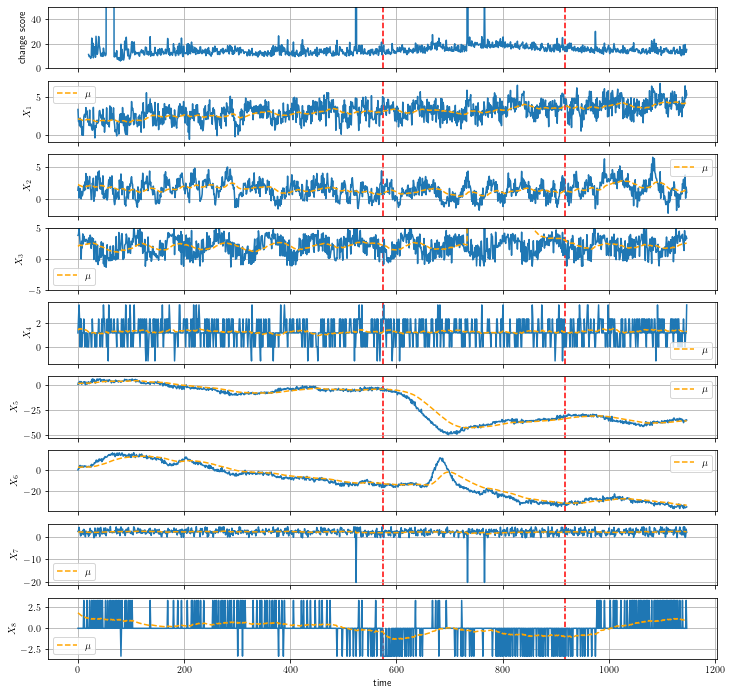

 39%|███▉      | 446/1145 [00:00<00:00, 4458.79it/s]

n = 2


100%|██████████| 1145/1145 [00:00<00:00, 4382.86it/s]


2 : 0.6306359875904861


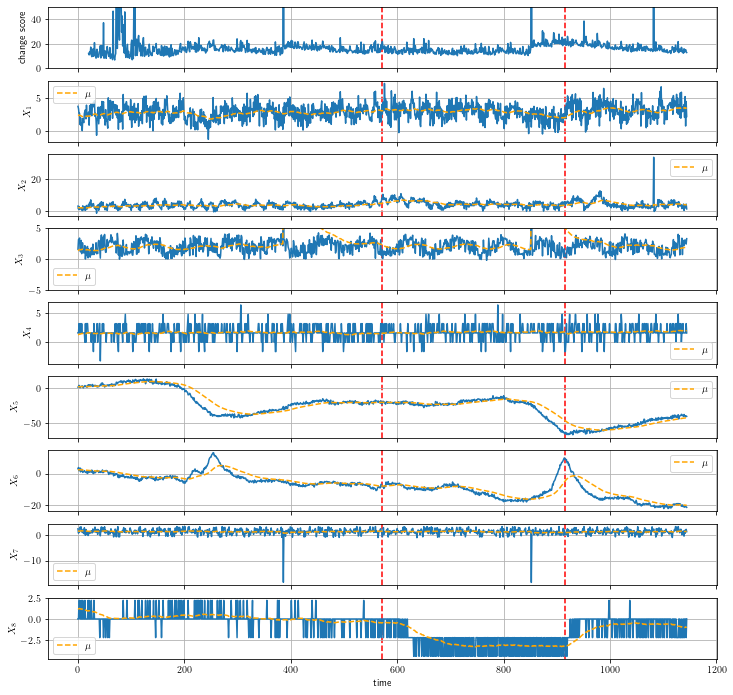

 37%|███▋      | 396/1075 [00:00<00:00, 3959.81it/s]

n = 3


100%|██████████| 1075/1075 [00:00<00:00, 3978.92it/s]


3 : 0.5266715440356745


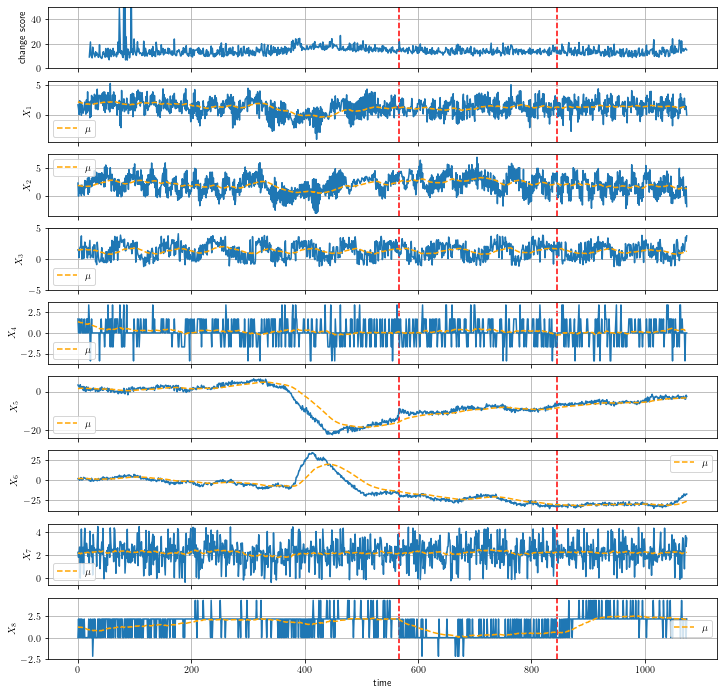

 35%|███▌      | 405/1149 [00:00<00:00, 4040.78it/s]

n = 4


100%|██████████| 1149/1149 [00:00<00:00, 4063.89it/s]


4 : 0.4869522399588053


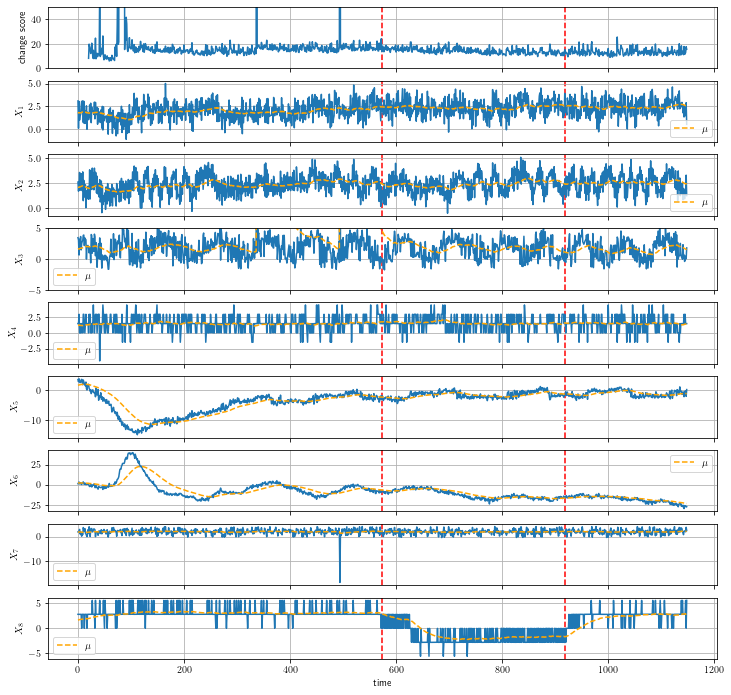

 34%|███▎      | 367/1095 [00:00<00:00, 3666.37it/s]

n = 5


100%|██████████| 1095/1095 [00:00<00:00, 3648.09it/s]


5 : 0.5800265812431843


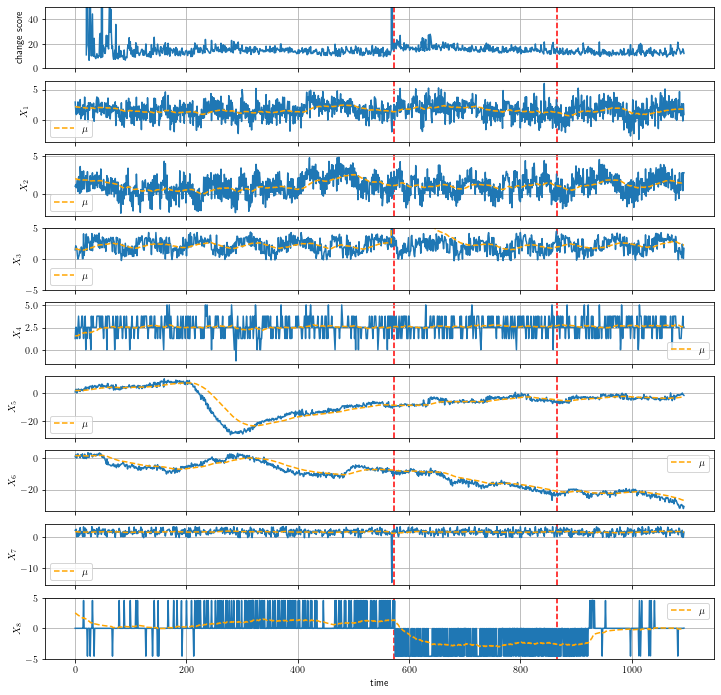

 30%|██▉       | 343/1154 [00:00<00:00, 3423.67it/s]

n = 6


100%|██████████| 1154/1154 [00:00<00:00, 3422.99it/s]


6 : 0.41214139344262296


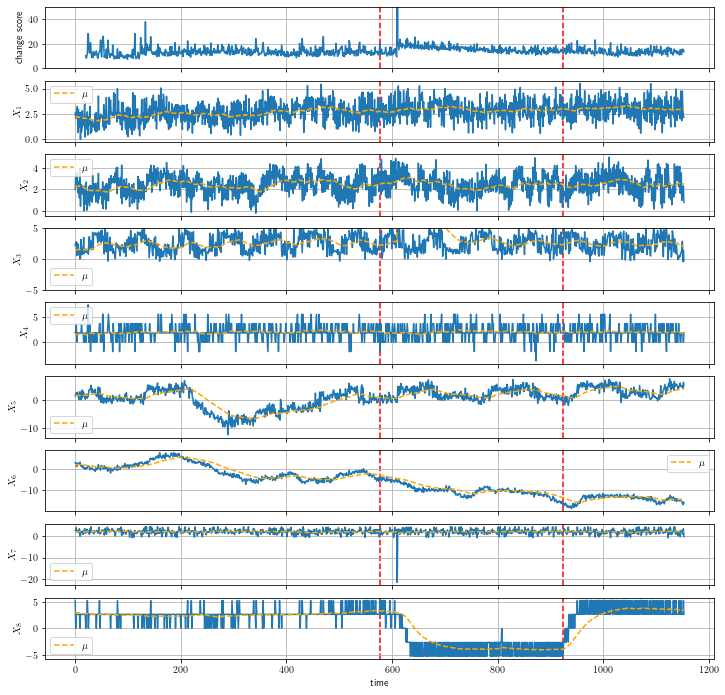

 65%|██████▌   | 754/1154 [00:00<00:00, 3774.35it/s]

n = 7


100%|██████████| 1154/1154 [00:00<00:00, 3742.36it/s]


7 : 0.5135655737704918


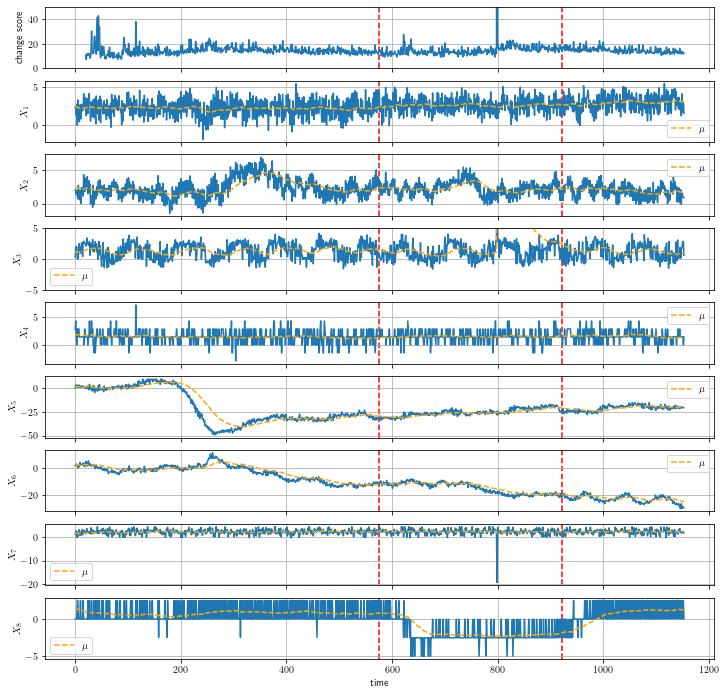

 35%|███▍      | 378/1094 [00:00<00:00, 3770.73it/s]

n = 8


100%|██████████| 1094/1094 [00:00<00:00, 3737.79it/s]


8 : 0.5563284661572051


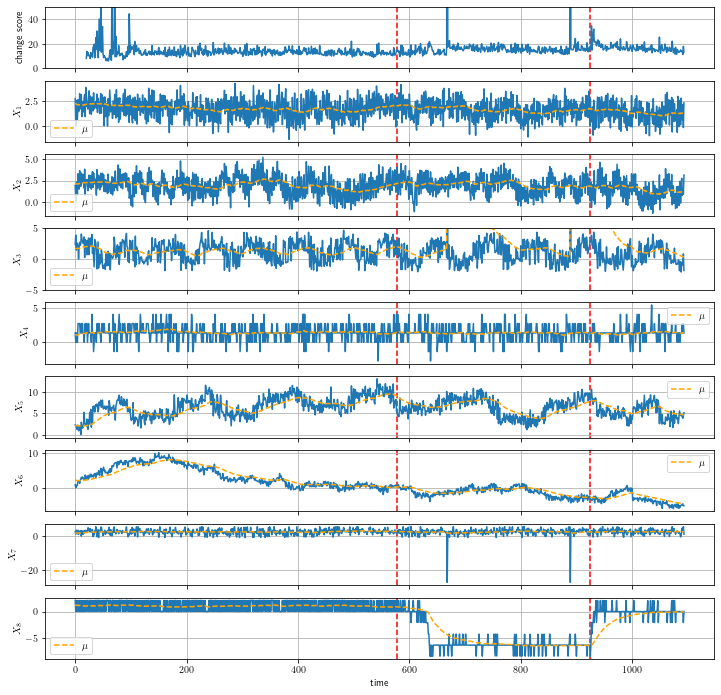

 33%|███▎      | 382/1144 [00:00<00:00, 3810.71it/s]

n = 9


100%|██████████| 1144/1144 [00:00<00:00, 3616.14it/s]


9 : 0.6488638716356108


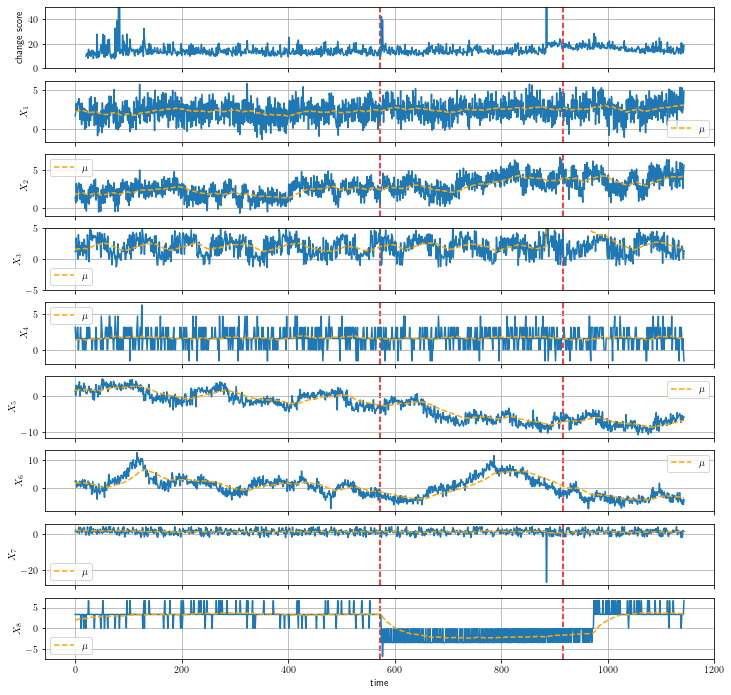

 62%|██████▏   | 714/1148 [00:00<00:00, 3306.47it/s]

n = 10


100%|██████████| 1148/1148 [00:00<00:00, 3303.74it/s]


10 : 0.5645463917525773


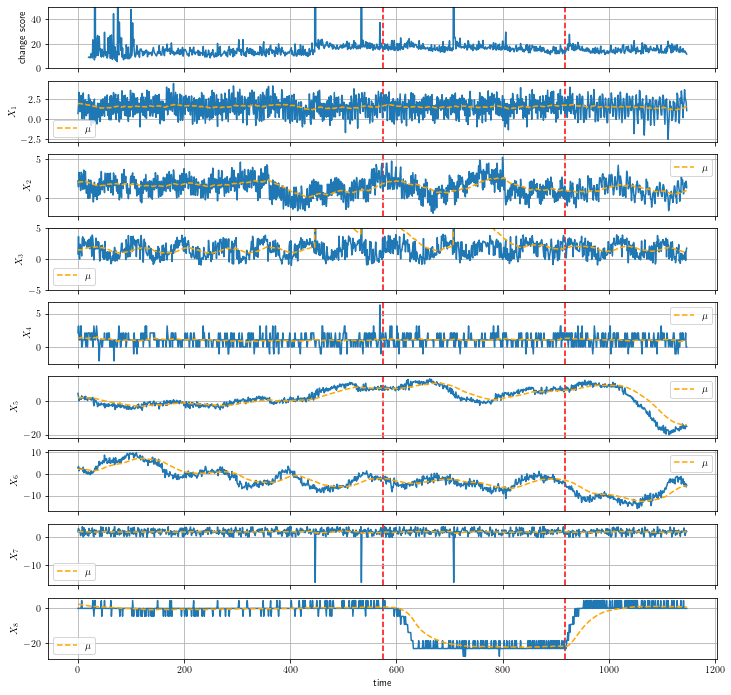

 29%|██▊       | 328/1146 [00:00<00:00, 3273.81it/s]

n = 11


100%|██████████| 1146/1146 [00:00<00:00, 3397.54it/s]


11 : 0.6666877582644629


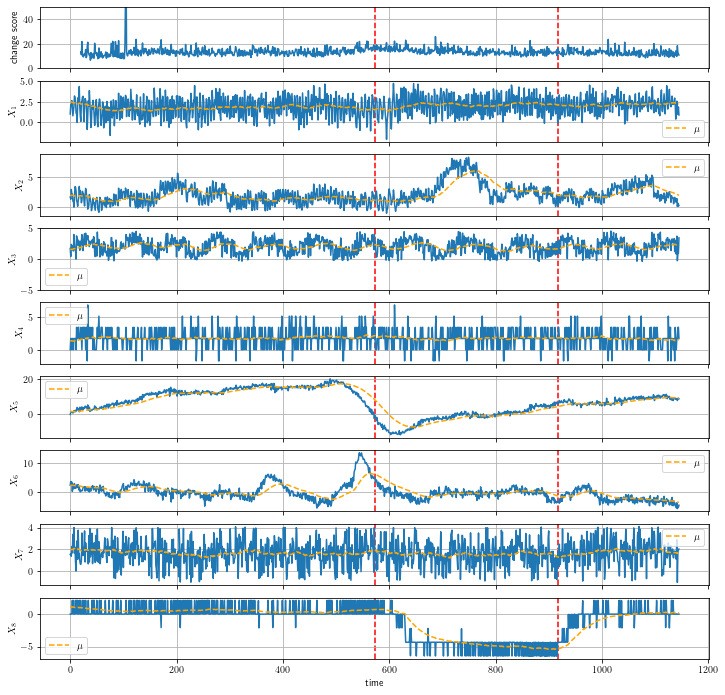

 32%|███▏      | 367/1141 [00:00<00:00, 3665.39it/s]

n = 12


100%|██████████| 1141/1141 [00:00<00:00, 3588.14it/s]


12 : 0.5649084890965732


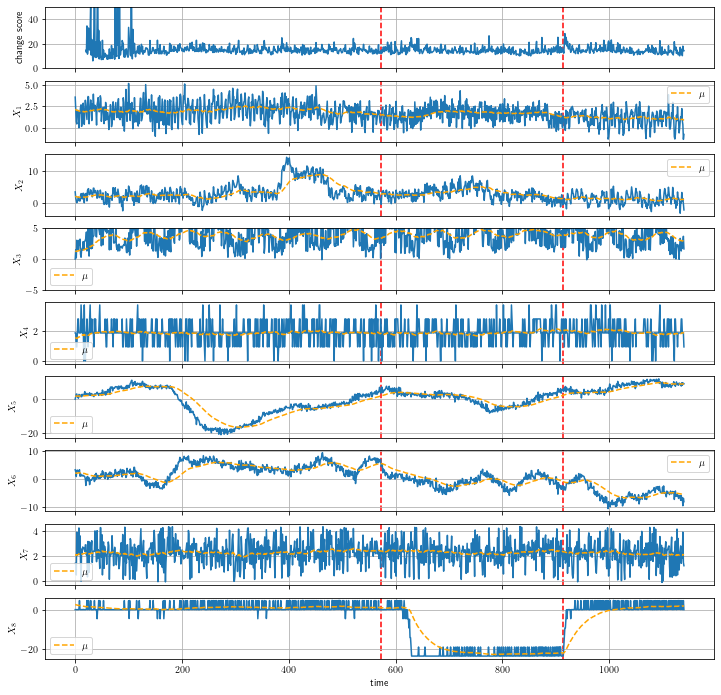

 30%|██▉       | 341/1140 [00:00<00:00, 3407.01it/s]

n = 13


100%|██████████| 1140/1140 [00:00<00:00, 3663.69it/s]


13 : 0.5840865384615386


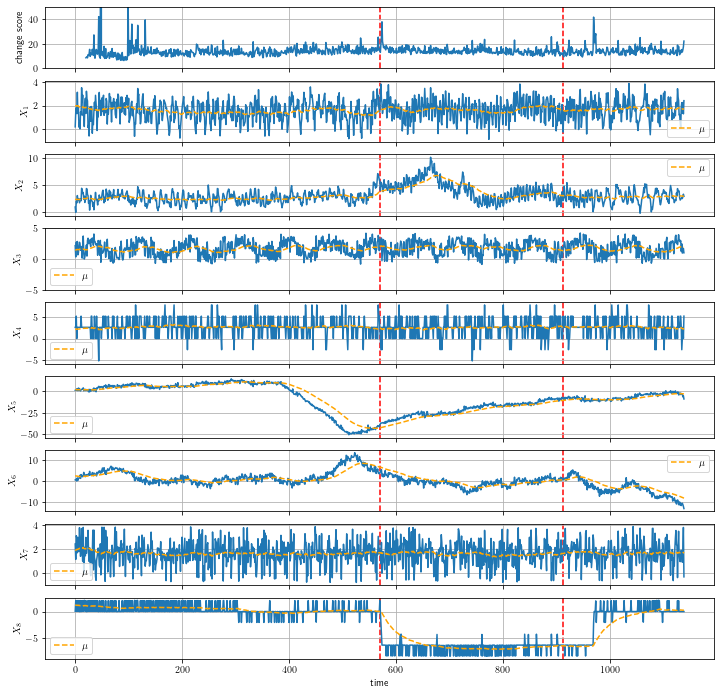

 33%|███▎      | 379/1140 [00:00<00:00, 3781.91it/s]

n = 14


100%|██████████| 1140/1140 [00:00<00:00, 3827.97it/s]


14 : 0.4936908783783785


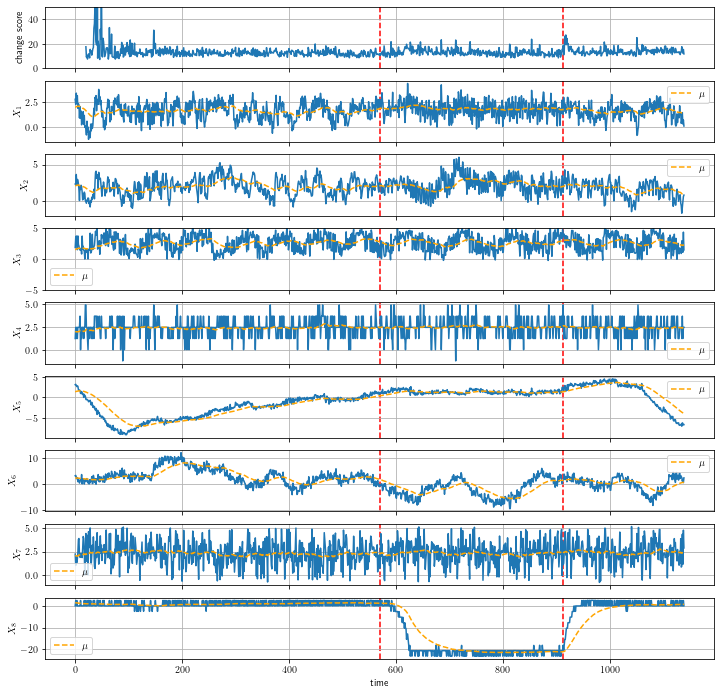

 32%|███▏      | 366/1139 [00:00<00:00, 3654.88it/s]

n = 15


100%|██████████| 1139/1139 [00:00<00:00, 3698.04it/s]


15 : 0.5362415452653486


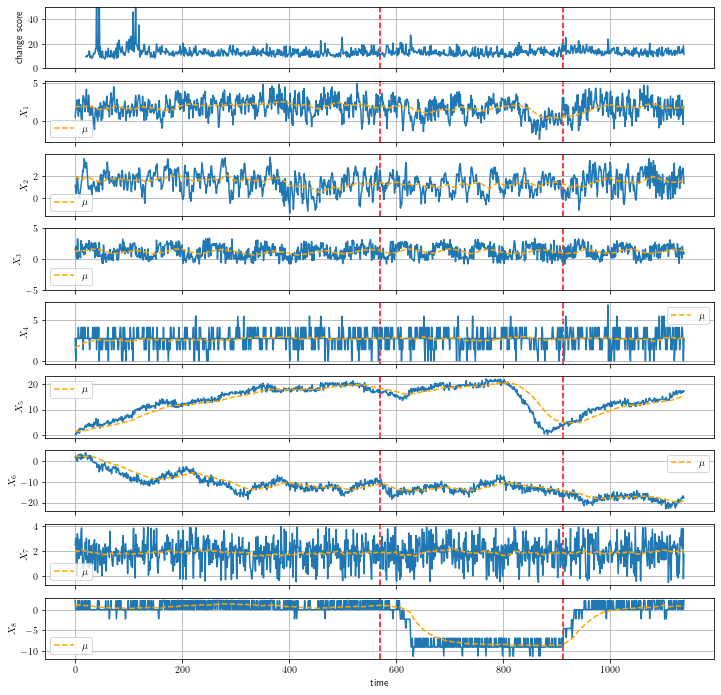

 32%|███▏      | 371/1150 [00:00<00:00, 3708.33it/s]

n = 16


100%|██████████| 1150/1150 [00:00<00:00, 3578.10it/s]


16 : 0.6227797067901235


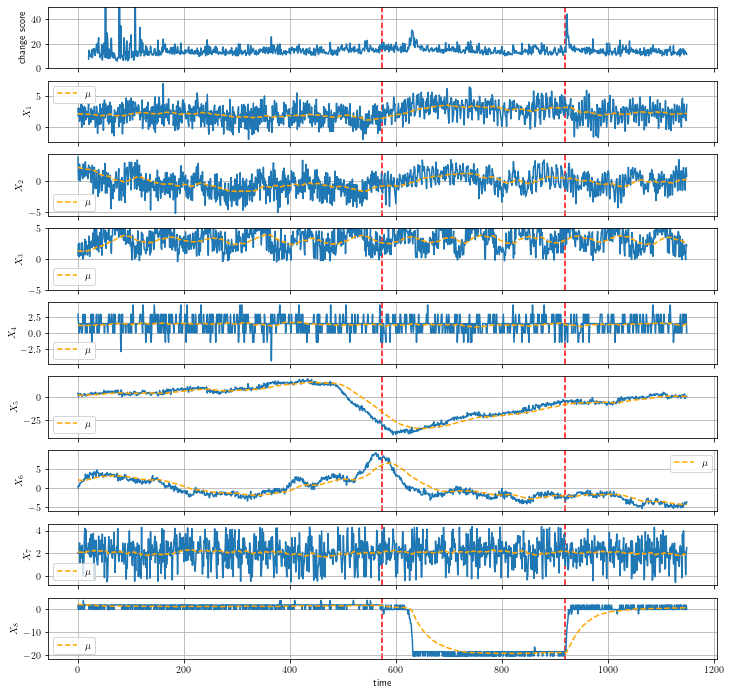

100%|██████████| 1150/1150 [00:00<00:00, 3449.44it/s]


In [22]:
k = 1
#k = 2
n_cluster = k

r = 0.03
#r = 0.03

init_start = 0
init_end = 20

score_start = 20

#res_iem = []
scores_sdem_list = []

for n, (X, idxes_anomaly, idxes_change) in enumerate(zip(X_list, idxes_anomaly_list, idxes_change_list)):
    print(f'n = {n+1}')
    trial = 0
    count_success = 0
    #for trial in range(10):
    while count_success < 5:
        seed = trial
        np.random.seed(seed)
        trial += 1
        #try:
        #scores_iem, X_init = calc_scores_iem(X, k, 
        #                                     init_start=0, init_end=500,
        #                                     score_start=20, 
        #                                     alpha=1.0, seed=seed)
        rho_const = np.repeat([r], X.shape[0])
        sdem = SDEM(rho_const, alpha=1.0, n_components=n_cluster)
        
        X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
                                               np.max(X[init_start:init_end, j]), 
                                               20).reshape(-1, 1) 
                             for j in range(X.shape[1]) ])
    
        sdem.fit(X_init)
        
        for t in tqdm.tqdm(range(X.shape[0])):
            sdem.update(X[t, :])

        pi_est = np.array(sdem.pi_list)
        mu_est = np.array(sdem.means_list)
        sigma_est = np.array(sdem.covariances_list)
        
        scores = [np.nan] * score_start

        #n_cluster = pi_est.shape[1]
        for t in range(score_start, X.shape[0]):
            p = np.zeros(n_cluster)
            for k in range(n_cluster):
                if np.any(np.linalg.eigvals(sigma_est[t-1, k, :, :]) <= 0.0):
                    sigma_est[t-1, k, :, :] = nearPD(sigma_est[t-1, k, :, :])
                if X.shape[0] == 1:
                    p_k = pi_est[t-1, k] * norm(mu_est[t-1, k, :], np.sqrt(sigma_est[t-1, k, :, :])).pdf(X[t, :])
                else:
                    try:
                        p_k = pi_est[t-1, k] * multivariate_normal(
                            mean=mu_est[t-1, k, :], 
                            cov=sigma_est[t-1, k, :, :], 
                            allow_singular=True
                        ).pdf(
                            X[t, :].reshape(1, -1)
                        )
                    except:
                        p_k = pi_est[t-1, k] * multivariate_normal(
                            mean=mu_est[t-1, k, :], 
                            cov=nearPD(sigma_est[t-1, k, :, :]), 
                            allow_singular=True
                        ).pdf(
                            X[t, :].reshape(1, -1)
                        )
                p[k] = p_k
            p_tot = np.sum(p)
            if p_tot >= 1.0/np.finfo(float).max:
                scores.append(-np.log(p_tot))
            else:
                scores.append(np.log(np.finfo(float).max))

        scores = np.array(scores)
        
        if count_success == 0:
            auc_ = calc_auc_main(scores, idxes_change, 
                             start=100, end=X.shape[0], 
                             T=T_auc, N_thr=100)
            print(n+1, ':', auc_)
        
            plot_skab_with_mu(X, idxes_anomaly, idxes_change, mu_est, scores)
        
        scores_sdem_list.append(scores)
        #auc_ = calc_auc_main(scores_iem, idxes_change, 
        #                     start=20, end=X.shape[0], 
        #                     T=T_auc, N_thr=100)
        #print(auc_)
        #res_iem.append([n, k, auc_])

        count_success += 1
        #except:
        #    continue

## iEM

 30%|███       | 348/1148 [00:00<00:00, 3471.81it/s]

n = 0


100%|██████████| 1148/1148 [00:00<00:00, 3464.52it/s]


1 : 0.5359213917525772


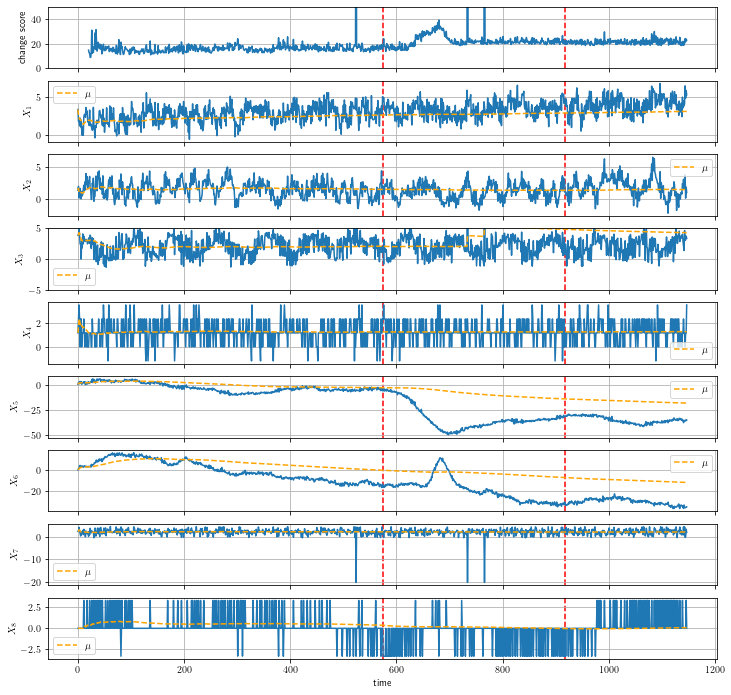

 29%|██▊       | 328/1145 [00:00<00:00, 3277.45it/s]

n = 1


100%|██████████| 1145/1145 [00:00<00:00, 3859.91it/s]


2 : 0.7267605997931748


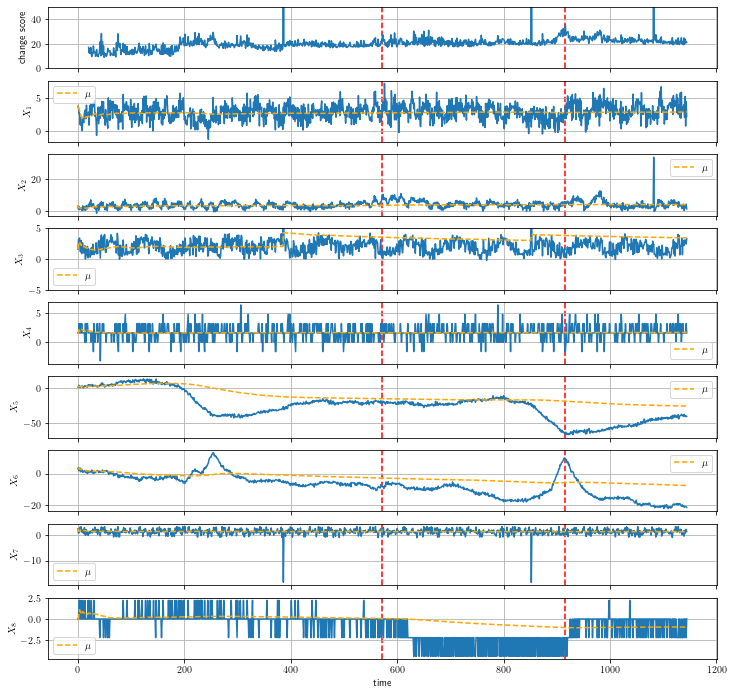

 38%|███▊      | 413/1075 [00:00<00:00, 4121.42it/s]

n = 2


100%|██████████| 1075/1075 [00:00<00:00, 4104.43it/s]


3 : 0.5132699275362319


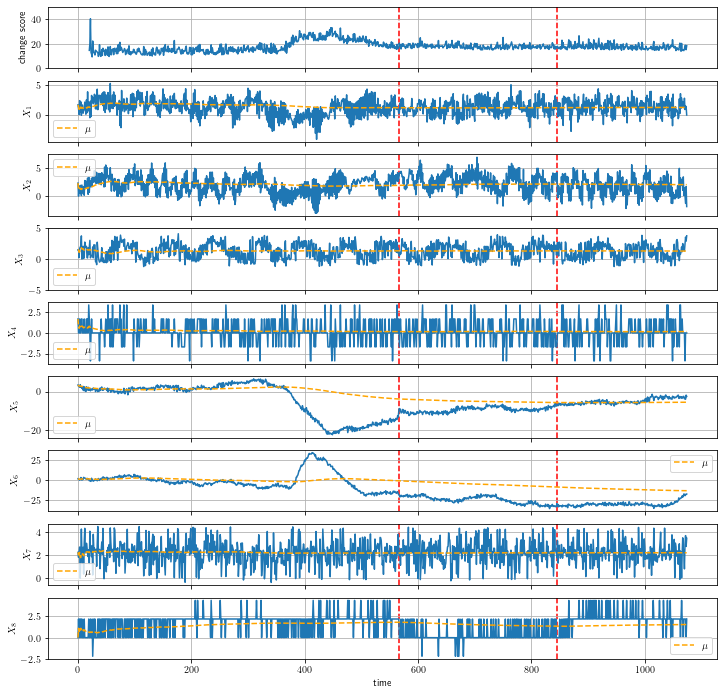

 30%|███       | 348/1149 [00:00<00:00, 3470.83it/s]

n = 3


100%|██████████| 1149/1149 [00:00<00:00, 3397.97it/s]


4 : 0.552605561277034


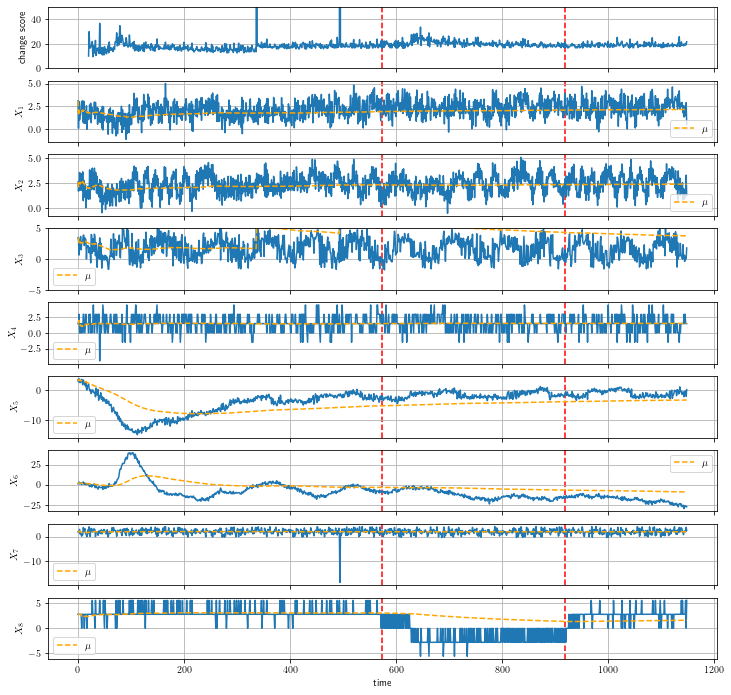

 42%|████▏     | 456/1095 [00:00<00:00, 4550.99it/s]

n = 4


100%|██████████| 1095/1095 [00:00<00:00, 4474.24it/s]


5 : 0.5934446564885497


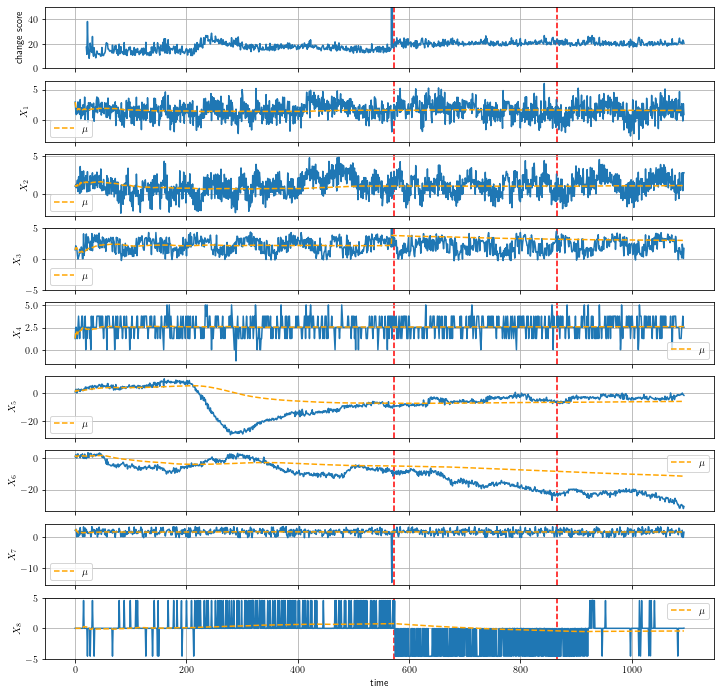

 26%|██▋       | 305/1154 [00:00<00:00, 3042.34it/s]

n = 5


100%|██████████| 1154/1154 [00:00<00:00, 3186.83it/s]


6 : 0.44735143442622954


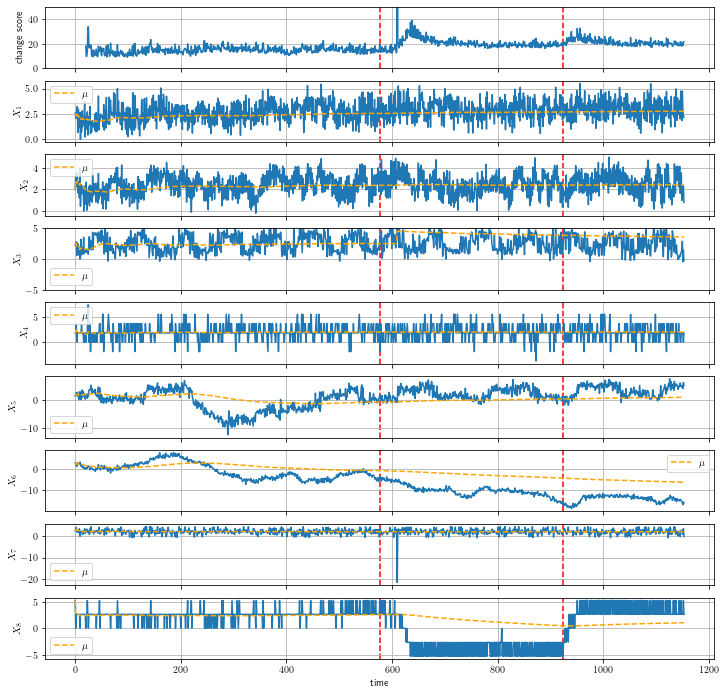

 33%|███▎      | 384/1154 [00:00<00:00, 3839.62it/s]

n = 6


100%|██████████| 1154/1154 [00:00<00:00, 3478.04it/s]


7 : 0.45804047131147535


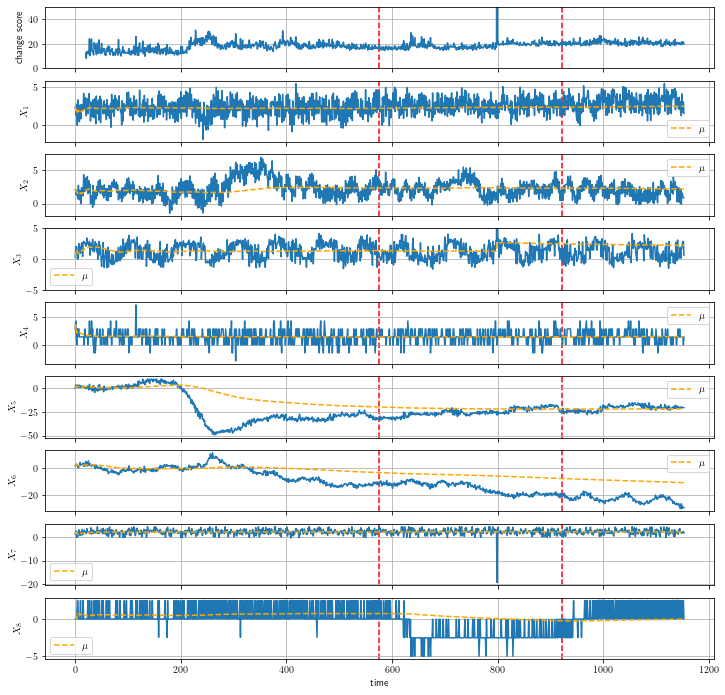

 80%|███████▉  | 874/1094 [00:00<00:00, 4379.13it/s]

n = 7


100%|██████████| 1094/1094 [00:00<00:00, 4292.99it/s]


8 : 0.47826146288209603


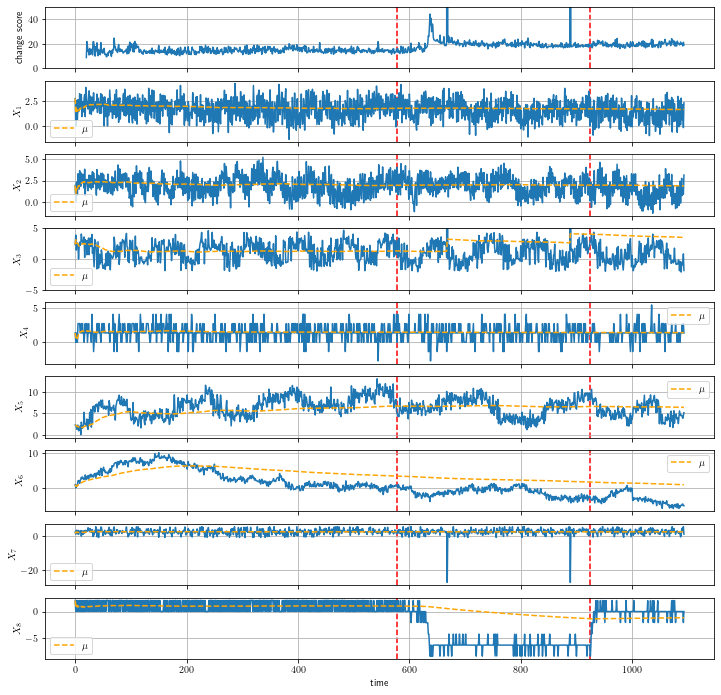

 36%|███▌      | 408/1144 [00:00<00:00, 4077.27it/s]

n = 8


100%|██████████| 1144/1144 [00:00<00:00, 3909.88it/s]


9 : 0.6032576345755694


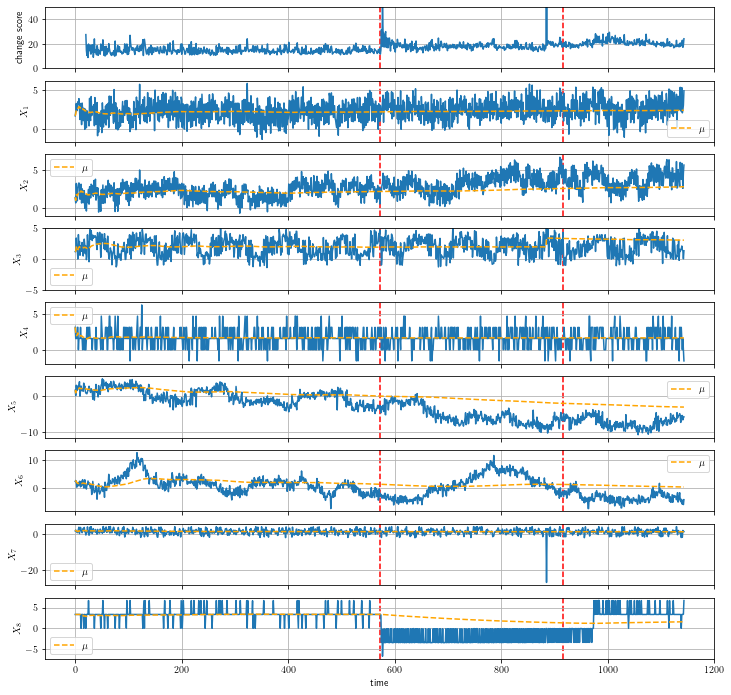

 71%|███████   | 814/1148 [00:00<00:00, 4071.04it/s]

n = 9


100%|██████████| 1148/1148 [00:00<00:00, 4087.14it/s]


10 : 0.5154297680412371


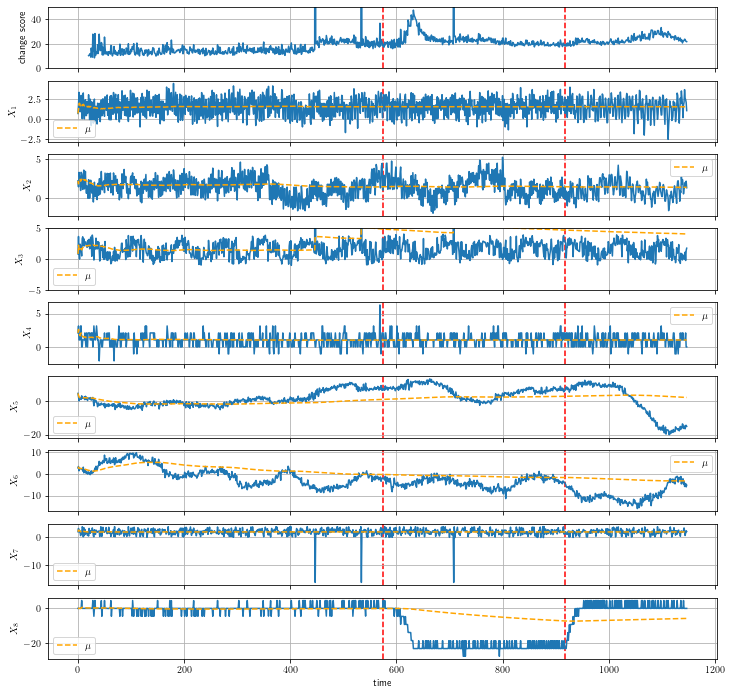

 31%|███       | 353/1146 [00:00<00:00, 3527.25it/s]

n = 10


100%|██████████| 1146/1146 [00:00<00:00, 3525.23it/s]


11 : 0.6123876549586778


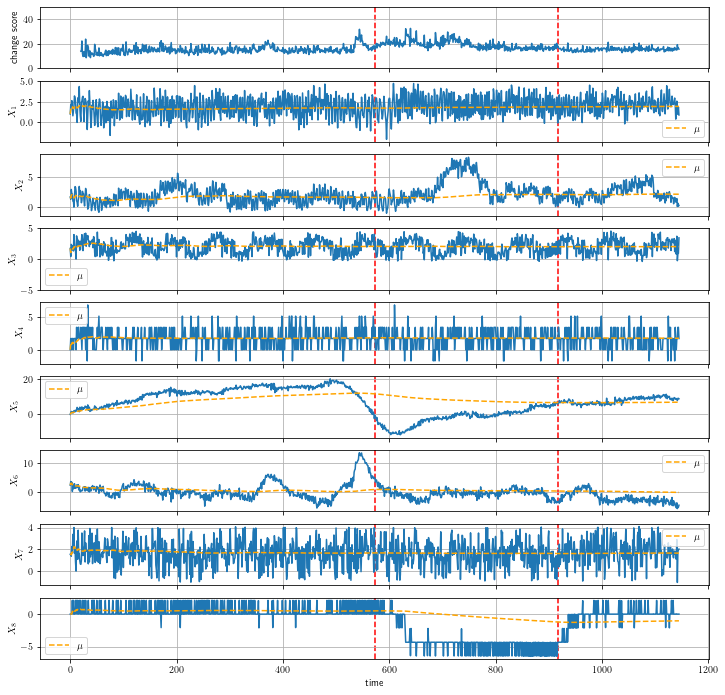

 33%|███▎      | 377/1141 [00:00<00:00, 3762.48it/s]

n = 11


100%|██████████| 1141/1141 [00:00<00:00, 3538.08it/s]


12 : 0.3730295950155763


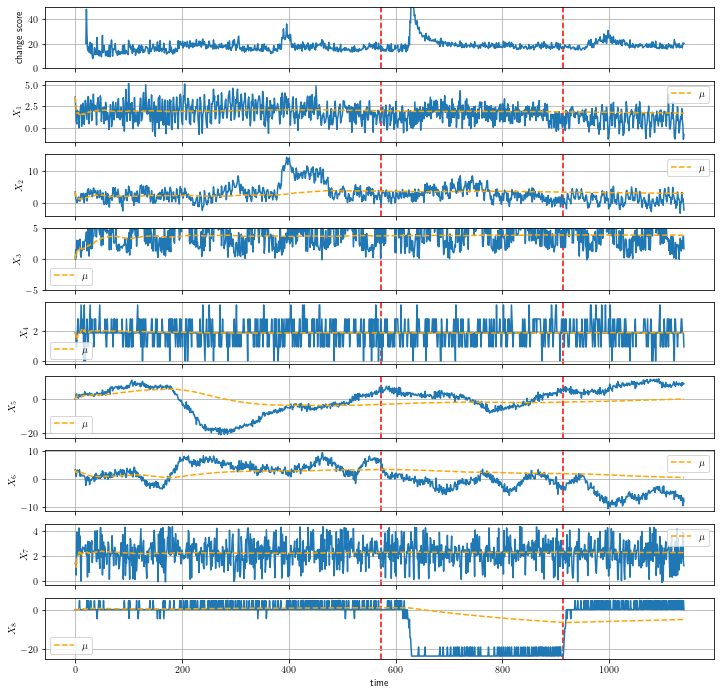

 30%|███       | 345/1140 [00:00<00:00, 3447.34it/s]

n = 12


100%|██████████| 1140/1140 [00:00<00:00, 3903.12it/s]


13 : 0.6401227910602911


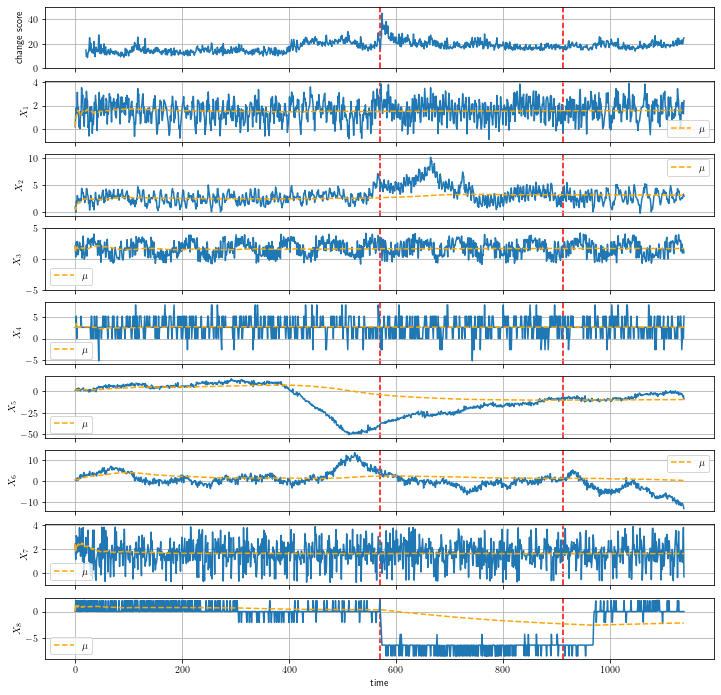

 35%|███▌      | 401/1140 [00:00<00:00, 4006.47it/s]

n = 13


100%|██████████| 1140/1140 [00:00<00:00, 4052.55it/s]


14 : 0.41853430353430354


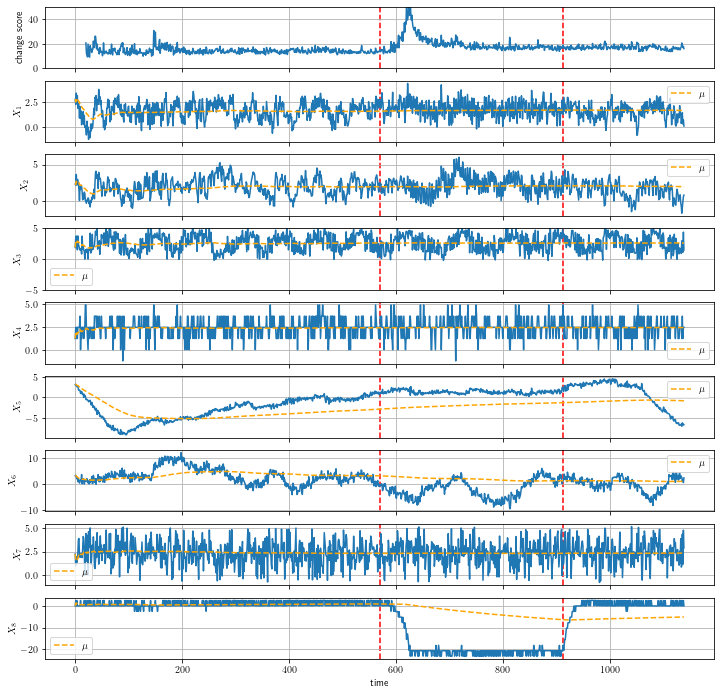

 39%|███▉      | 447/1139 [00:00<00:00, 4465.93it/s]

n = 14


100%|██████████| 1139/1139 [00:00<00:00, 4247.86it/s]


15 : 0.5157823881373569


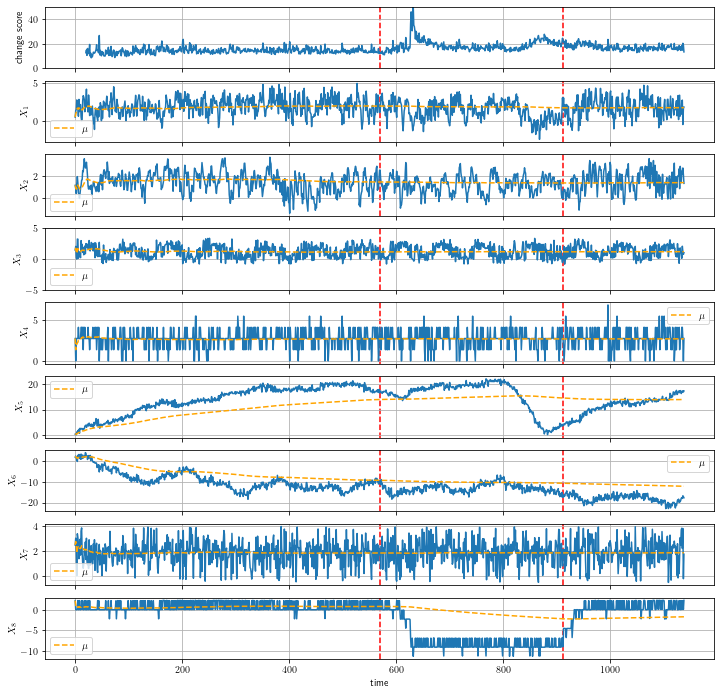

 31%|███       | 356/1150 [00:00<00:00, 3554.16it/s]

n = 15


100%|██████████| 1150/1150 [00:00<00:00, 3655.93it/s]


16 : 0.7213316615226337


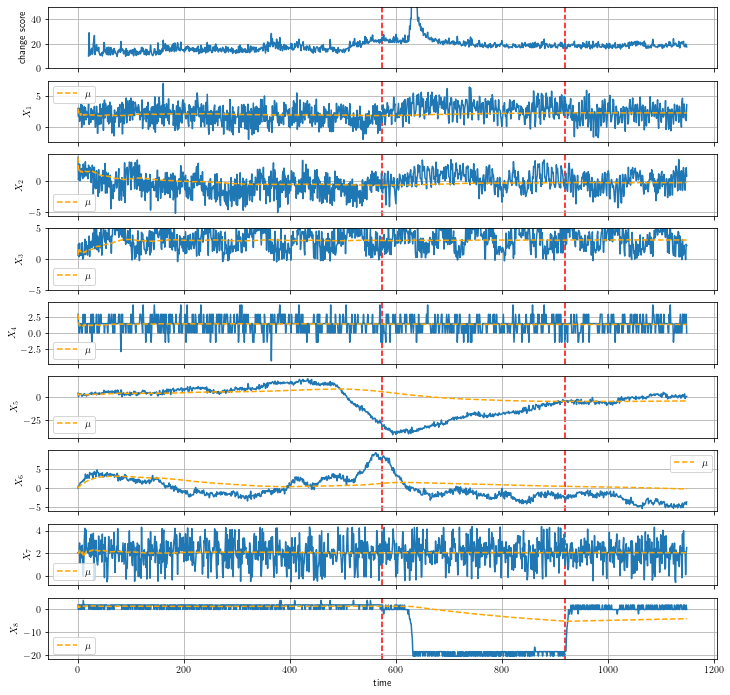

In [23]:
k = 1
n_cluster = k

init_start = 0
init_end = 20

score_start = 20

#res_iem = []
scores_iem_list = []

for n, (X, idxes_anomaly, idxes_change) in enumerate(zip(X_list, idxes_anomaly_list, idxes_change_list)):
    print(f'n = {n}')
    trial = 0
    count_success = 0
    #for trial in range(10):
    while count_success < 1:
        seed = trial
        np.random.seed(seed)
        trial += 1
        #try:
        #scores_iem, X_init = calc_scores_iem(X, k, 
        #                                     init_start=0, init_end=500,
        #                                     score_start=20, 
        #                                     alpha=1.0, seed=seed)
        rhos = 1.0 / np.arange(1, X.shape[0]+1)
        sdem = SDEM(rhos, alpha=1.0, n_components=n_cluster)
        
        X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
                                               np.max(X[init_start:init_end, j]), 
                                               20).reshape(-1, 1) 
                             for j in range(X.shape[1]) ])
    
        sdem.fit(X_init)

        for t in tqdm.tqdm(range(X.shape[0])):
            sdem.update(X[t, :])

        pi_est = np.array(sdem.pi_list)
        mu_est = np.array(sdem.means_list)
        sigma_est = np.array(sdem.covariances_list)
        
        scores = [np.nan] * score_start

        #n_cluster = pi_est.shape[1]
        for t in range(score_start, X.shape[0]):
            p = np.zeros(n_cluster)
            for k in range(n_cluster):
                if np.any(np.linalg.eigvals(sigma_est[t-1, k, :, :]) <= 0.0):
                    sigma_est[t-1, k, :, :] = nearPD(sigma_est[t-1, k, :, :])
                if X.shape[0] == 1:
                    p_k = pi_est[t-1, k] * norm(mu_est[t-1, k, :], np.sqrt(sigma_est[t-1, k, :, :])).pdf(X[t, :])
                else:
                    try:
                        p_k = pi_est[t-1, k] * multivariate_normal(
                            mean=mu_est[t-1, k, :], 
                            cov=sigma_est[t-1, k, :, :], 
                            allow_singular=True
                        ).pdf(
                            X[t, :].reshape(1, -1)
                        )
                    except:
                        p_k = pi_est[t-1, k] * multivariate_normal(
                            mean=mu_est[t-1, k, :], 
                            cov=nearPD(sigma_est[t-1, k, :, :]), 
                            allow_singular=True
                        ).pdf(
                            X[t, :].reshape(1, -1)
                        )
                p[k] = p_k
            p_tot = np.sum(p)
            if p_tot >= 1.0/np.finfo(float).max:
                scores.append(-np.log(p_tot))
            else:
                scores.append(np.log(np.finfo(float).max))

        scores = np.array(scores)
        
        if count_success ==0:
            auc_ = calc_auc_main(scores, idxes_change, 
                                 start=100, end=X.shape[0], 
                                 T=T_auc, N_thr=100)
            print(n+1, ':', auc_)
            
            plot_skab_with_mu(X, idxes_anomaly, idxes_change, mu_est, scores)
        
        scores_iem_list.append(scores)

        #res_iem.append([n, k, auc_])

        count_success += 1
                
        #except:
        #    continue

## sEM

In [24]:
def sem(X, theta0, rho, 
        #X_init, 
        init_start, init_end, 
        score_start, score_end, 
        seed):
    np.random.seed(seed)
    
    #print('X.shape:', X.shape)
    K = len(theta0.mu)
    N = X.shape[0]
    D = X.shape[1]
    #print('N =', N)
    #print('D =', D)
    
    theta = deepcopy(theta0)
    pi_est = np.nan * np.ones((N, K, 1))
    mu_est = np.nan * np.ones((N, K, D))
    sigma_est = np.nan * np.ones((N, K, D, D))
    
    s = SuffStatGMM(K, D)
    #print('after initializing s:')
    #print('s.s1.shape:', s.s1.shape)
    #print('s.s2.shape:', s.s2.shape)
    #print('s.s3.shape:', s.s3.shape)
    
    #X_init = np.random.uniform(np.min(X[start:end, :]), np.max(X[start:end, :]), 20).reshape(-1, X.shape[1])
    #if X_init is None:
    #    X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
    #                                           np.max(X[init_start:init_end, j]), 
    #                                           20).reshape(-1, 1) 
    #                         for j in range(X.shape[1]) ])
    
    # initialization
    #tau = compute_tau(X_init, theta)
    #s.s1[:], s.s2[:], s.s3[:] = compute_stat(X_init, tau)
    tau = compute_tau(X[init_start:init_end, :], theta)
    s.s1[:], s.s2[:], s.s3[:] = compute_stat(X[init_start:init_end, :], tau)
    theta.pi[:], theta.mu[:], theta.sigma[:] = step_M(s, 1)
    pi_est[0, :] = theta.pi.copy()
    mu_est[0, :, :] = theta.mu.copy()
    sigma_est[0, :, :, :] = theta.sigma.copy()
    
    inds = np.arange(N)
    #print('inds.shape:', inds.shape)
    
    #for n in tqdm.tqdm(range(start, N)):
    #for n in tqdm.tqdm(range(score_start, score_end)):
    for n in tqdm.tqdm(range(1, score_end)):
        ind_n = inds[n]
        
        tau_indiv_new = compute_tau(X[ind_n, :].reshape(1, -1), theta).reshape(-1, 1)
        s2_indiv_new = np.outer(tau_indiv_new, X[ind_n, :])
        s3_indiv_new = np.einsum('k,ij->kij', tau_indiv_new.ravel(), np.outer(X[ind_n, :], X[ind_n, :]))
        
        if np.any(np.isnan(tau_indiv_new)):
            pi_est[n, :] = theta.pi.copy()
            mu_est[n, :, :] = theta.mu.copy()
            sigma_est[n, :, :, :] = theta.sigma.copy()
            continue
        
        s.s1 += rho[n] * (tau_indiv_new - s.s1)
        s.s2 += rho[n] * (s2_indiv_new - s.s2)
        s.s3 += rho[n] * (s3_indiv_new - s.s3)
        
        # M-step
        theta.pi[:], theta.mu[:], theta.sigma[:] = step_M(s, 1)
        #print('===========')
        #print('theta.pi')
        #print(theta.pi)
        #print('theta.mu')
        #print(theta.mu)
        #print('theta.sigma')
        #print(theta.sigma)
        pi_est[n, :] = theta.pi.copy()
        mu_est[n, :, :] = theta.mu.copy()
        sigma_est[n, :, :, :] = theta.sigma.copy()
        
    return pi_est, mu_est, sigma_est

 23%|██▎       | 262/1147 [00:00<00:00, 2615.21it/s]

n = 1


100%|██████████| 1147/1147 [00:00<00:00, 2571.82it/s]


1 : 0.4101557647058823


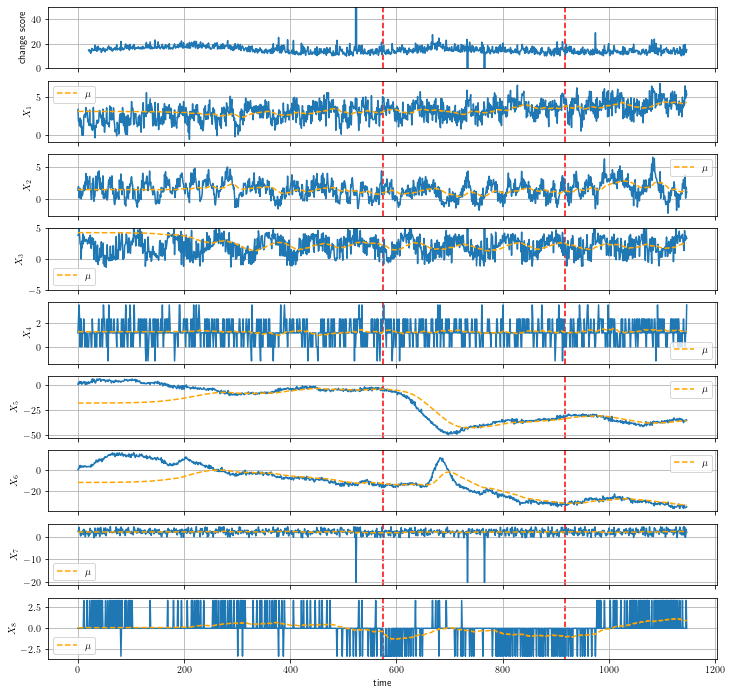

 24%|██▍       | 273/1144 [00:00<00:00, 2728.50it/s]

n = 2


/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 1144/1144 [00:00<00:00, 2985.04it/s]


2 : 0.5106919716646989


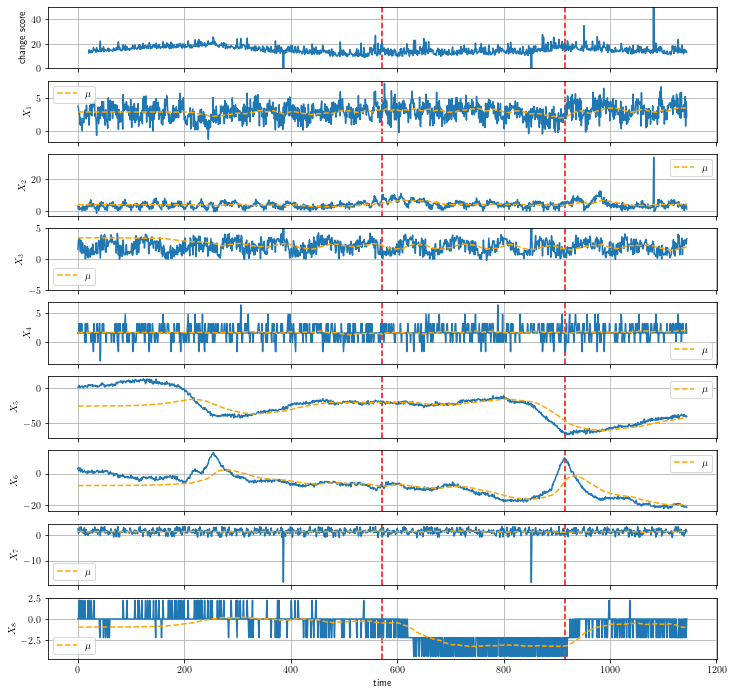

 26%|██▌       | 277/1074 [00:00<00:00, 2769.28it/s]

n = 3


100%|██████████| 1074/1074 [00:00<00:00, 2617.79it/s]


3 : 0.4889558558558558


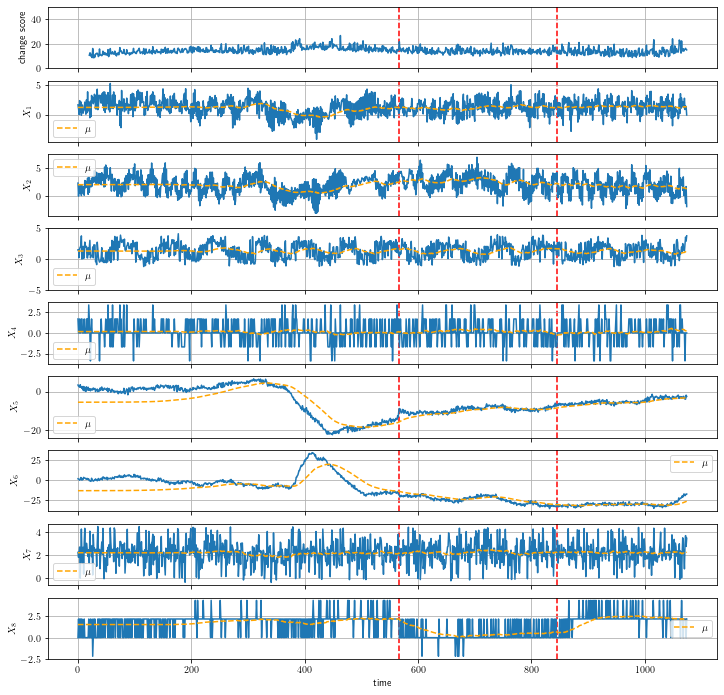

 24%|██▍       | 277/1148 [00:00<00:00, 2758.47it/s]

n = 4


/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 1148/1148 [00:00<00:00, 2733.45it/s]


4 : 0.45251750881316094


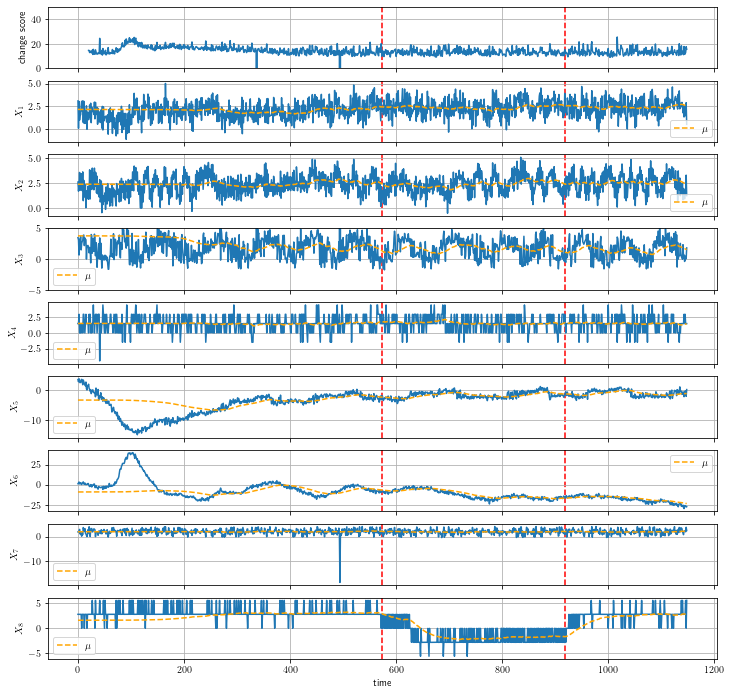

 23%|██▎       | 257/1094 [00:00<00:00, 2561.93it/s]

n = 5


100%|██████████| 1094/1094 [00:00<00:00, 2701.84it/s]


5 : 0.4078859473023839


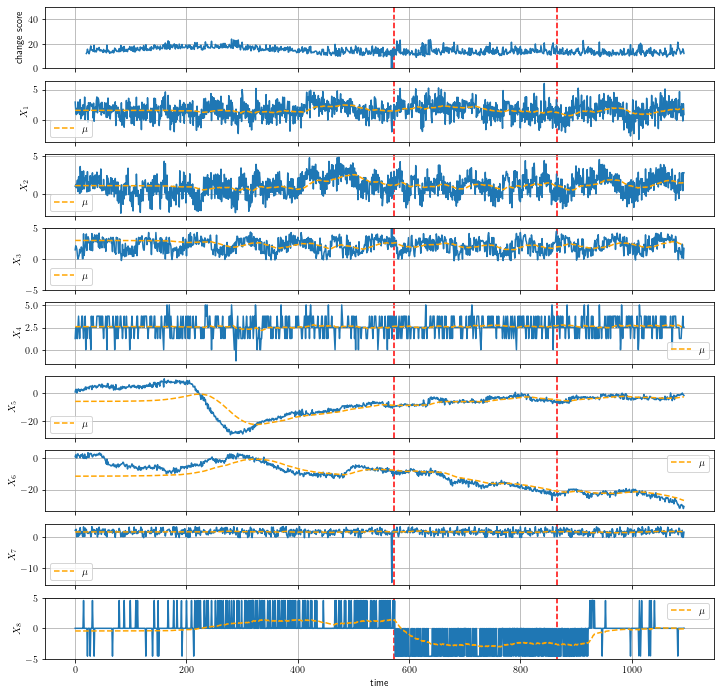

 25%|██▍       | 284/1153 [00:00<00:00, 2835.60it/s]

n = 6


100%|██████████| 1153/1153 [00:00<00:00, 2265.08it/s]


6 : 0.4871344626168225


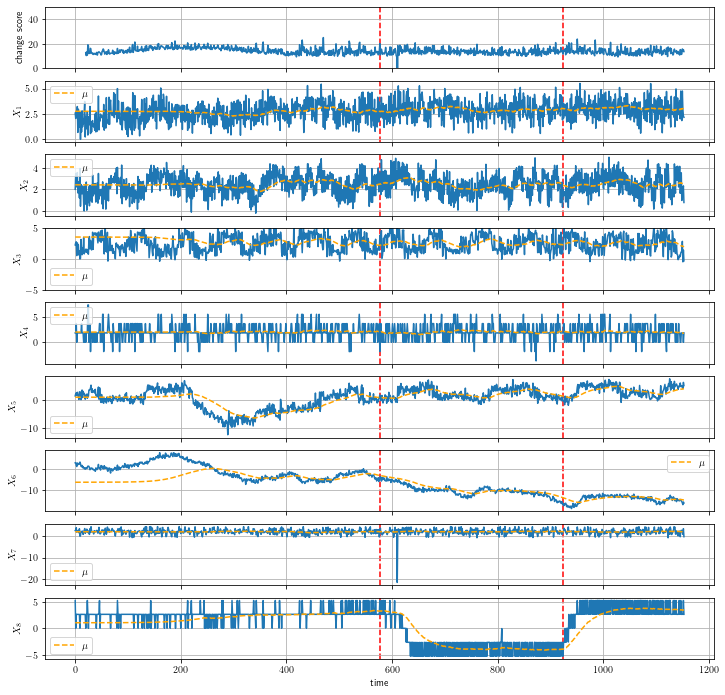

 24%|██▍       | 278/1153 [00:00<00:00, 2773.65it/s]

n = 7


100%|██████████| 1153/1153 [00:00<00:00, 2934.91it/s]


7 : 0.3572605140186916


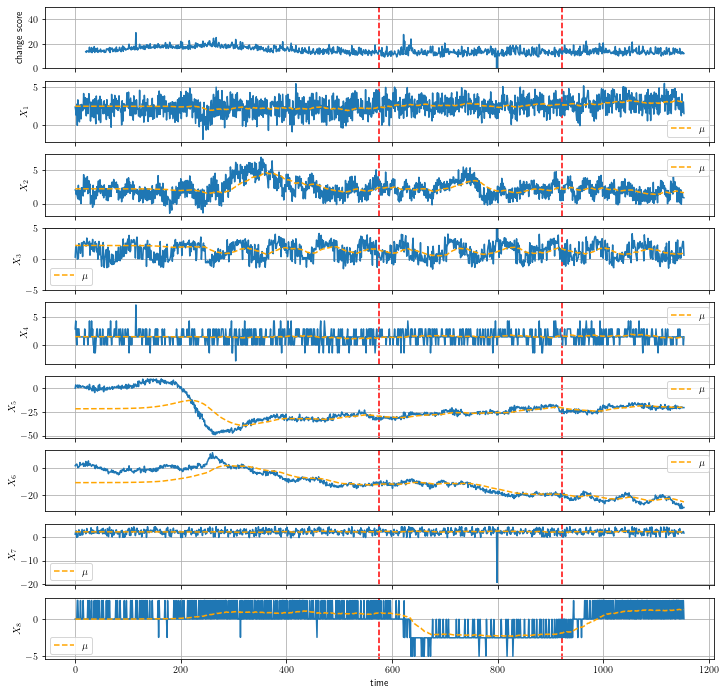

 26%|██▋       | 287/1093 [00:00<00:00, 2868.96it/s]

n = 8


100%|██████████| 1093/1093 [00:00<00:00, 2784.35it/s]


8 : 0.46440502512562815


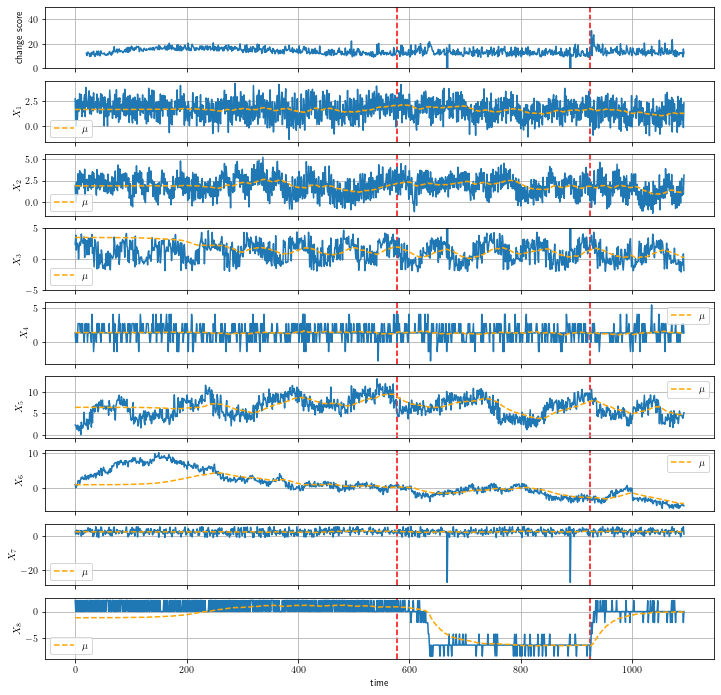

 24%|██▍       | 276/1143 [00:00<00:00, 2752.04it/s]

n = 9


100%|██████████| 1143/1143 [00:00<00:00, 2669.38it/s]


9 : 0.47634042553191497


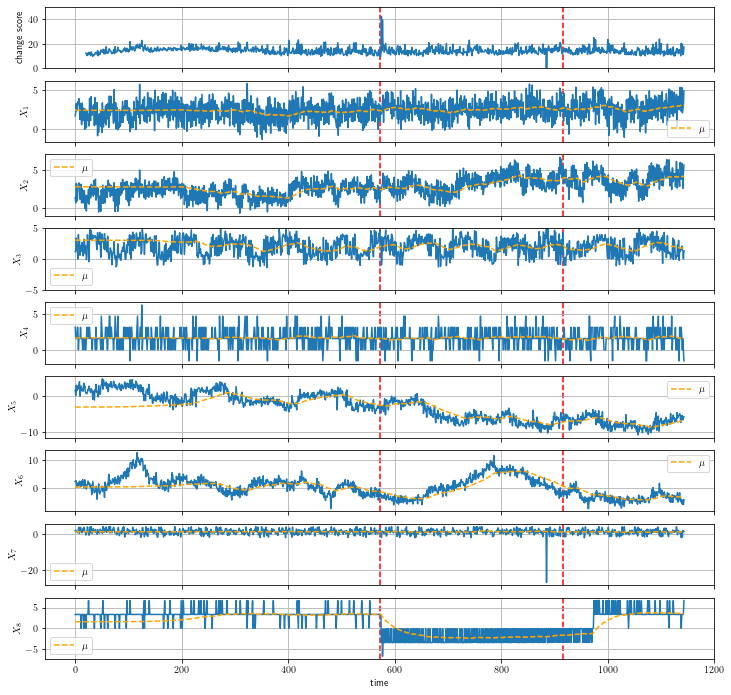

 27%|██▋       | 305/1147 [00:00<00:00, 3041.51it/s]

n = 10


/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 1147/1147 [00:00<00:00, 2763.46it/s]


10 : 0.4651715294117647


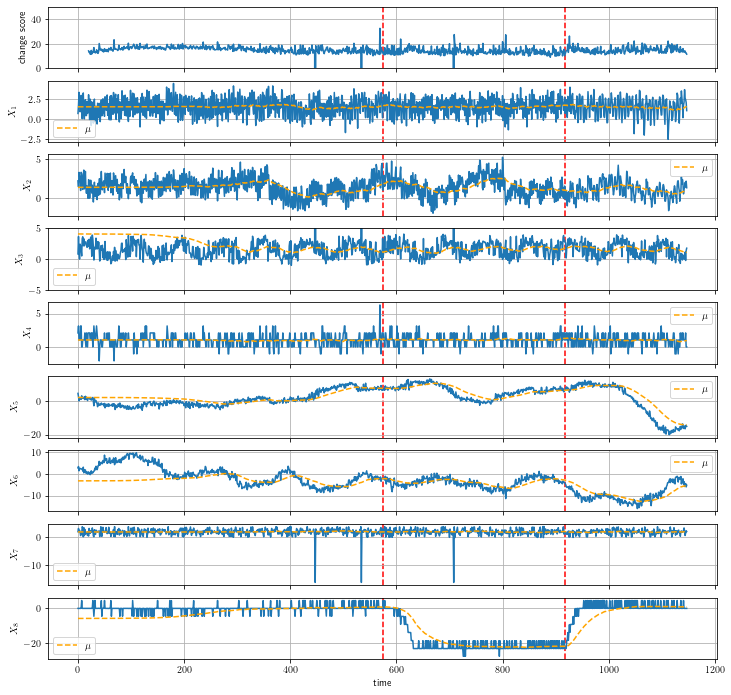

 23%|██▎       | 266/1145 [00:00<00:00, 2653.37it/s]

n = 11


100%|██████████| 1145/1145 [00:00<00:00, 2794.57it/s]


11 : 0.6899134433962264


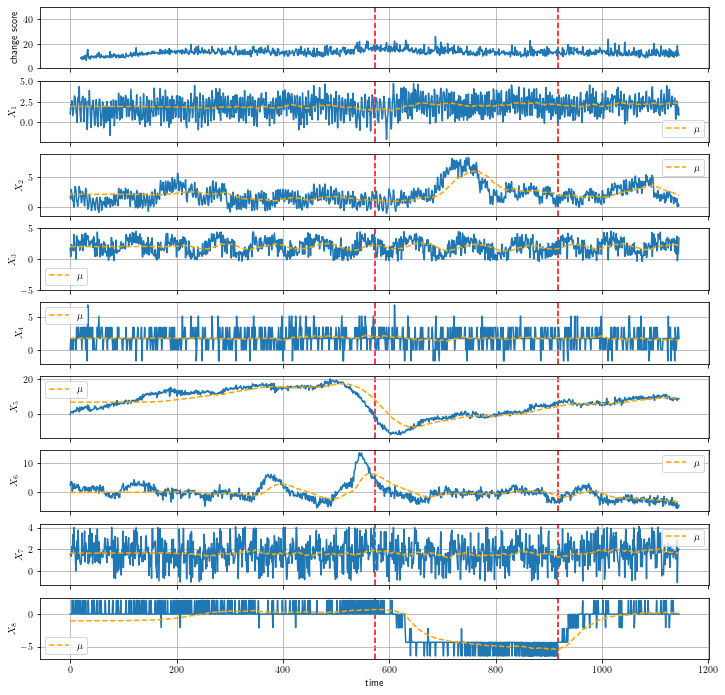

 27%|██▋       | 303/1140 [00:00<00:00, 3029.73it/s]

n = 12


100%|██████████| 1140/1140 [00:00<00:00, 3188.47it/s]


12 : 0.5105925266903915


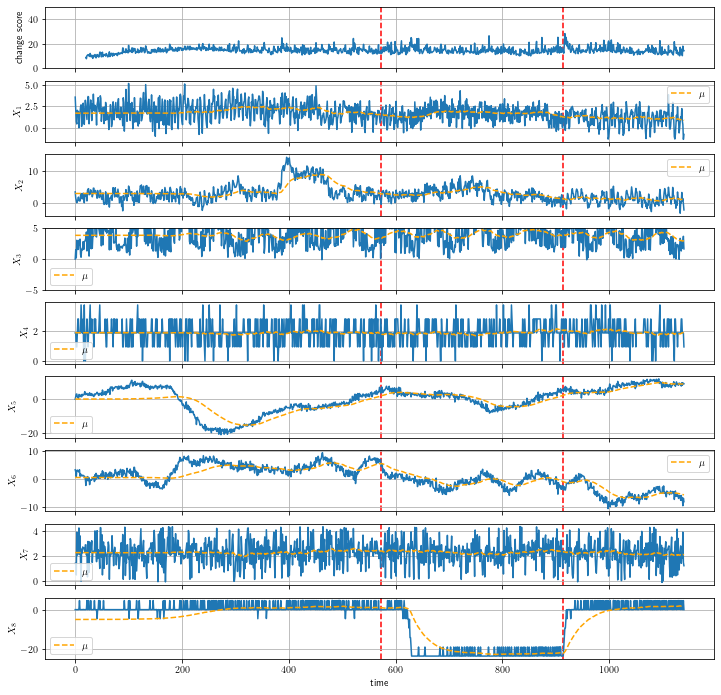

 24%|██▍       | 275/1139 [00:00<00:00, 2743.34it/s]

n = 13


100%|██████████| 1139/1139 [00:00<00:00, 2902.77it/s]


13 : 0.5348283847980997


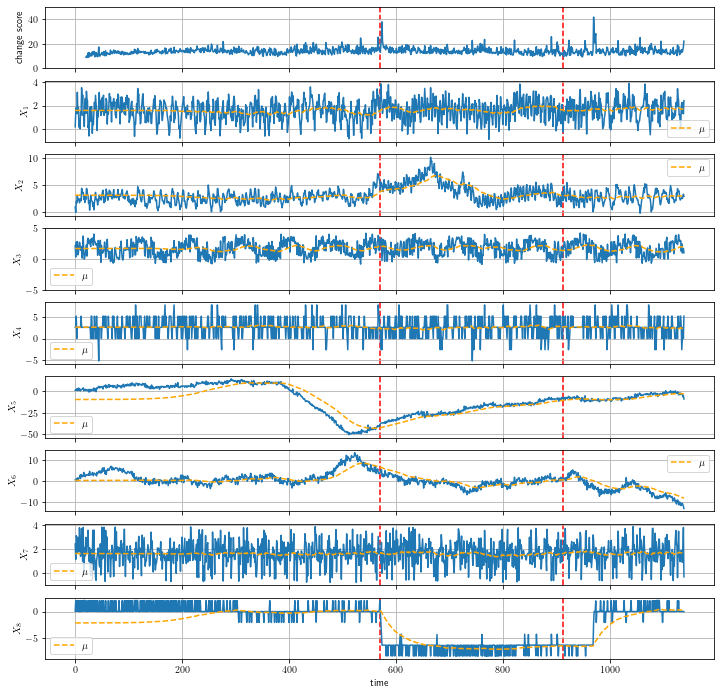

 26%|██▌       | 296/1139 [00:00<00:00, 2958.26it/s]

n = 14


100%|██████████| 1139/1139 [00:00<00:00, 3185.74it/s]


14 : 0.4265007125890736


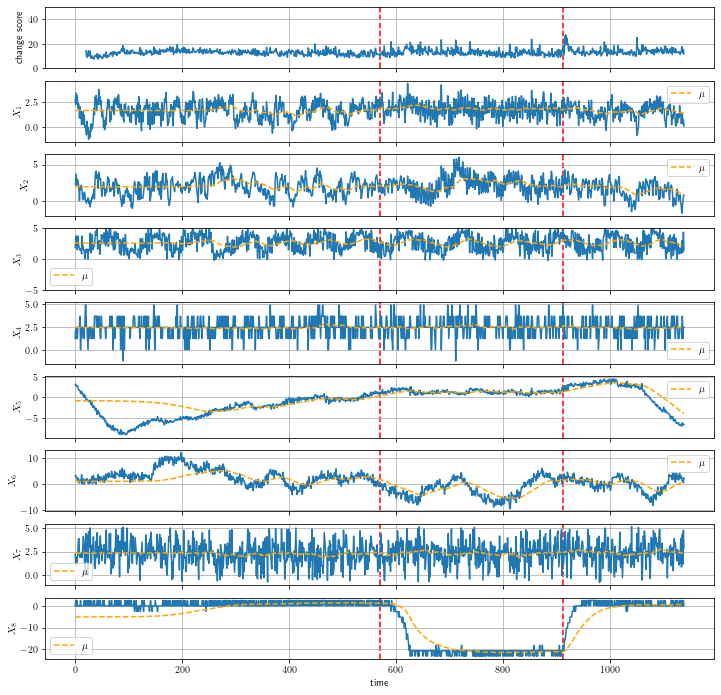

 27%|██▋       | 303/1138 [00:00<00:00, 3025.19it/s]

n = 15


100%|██████████| 1138/1138 [00:00<00:00, 2691.99it/s]


15 : 0.5922859690844233


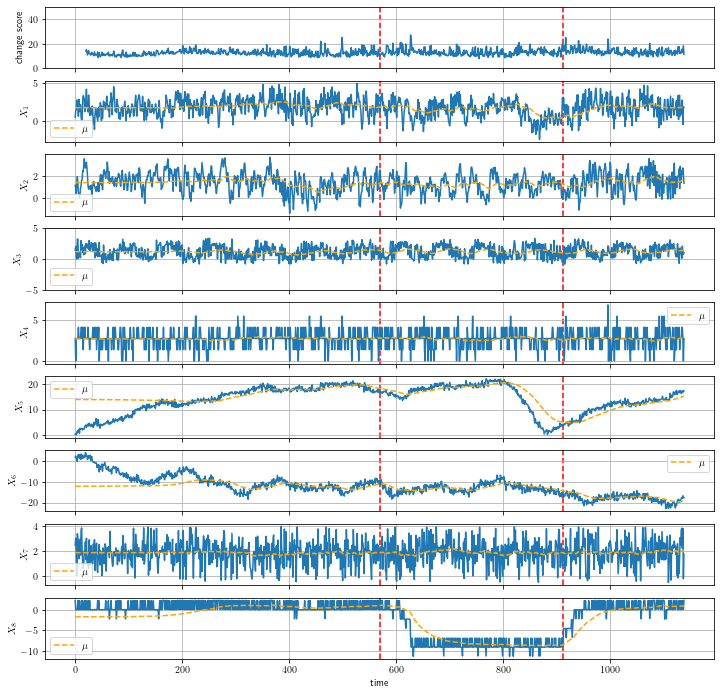

 26%|██▌       | 299/1149 [00:00<00:00, 2986.24it/s]

n = 16


100%|██████████| 1149/1149 [00:00<00:00, 2920.28it/s]


16 : 0.6215400234741784


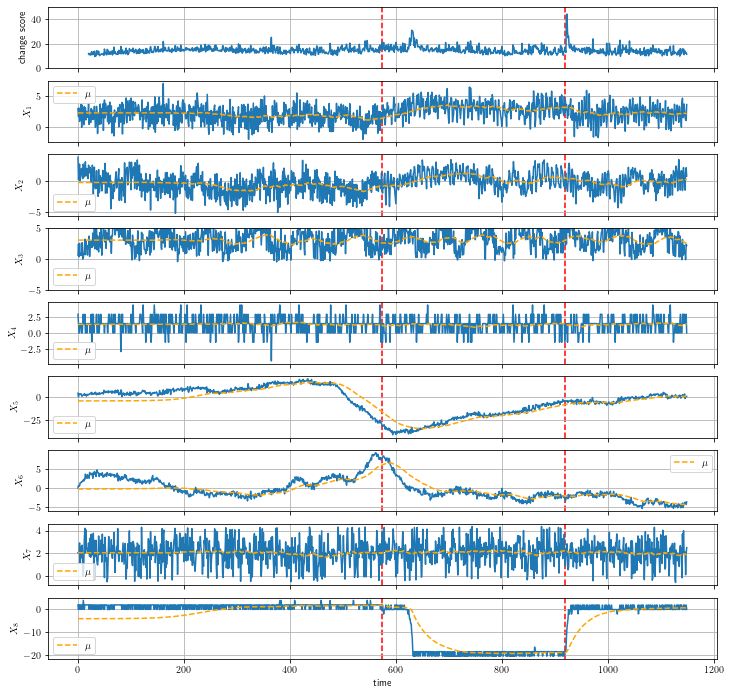

In [25]:
#init_start = 0
#init_end = 20

k = 1
#r_list = [0.001, 0.003, 0.005, 0.01, 0.03, 0.05, 0.1, 0.3, 0.5]
#r_list = [0.001, 0.003, 0.005, 0.01, 0.03, 0.05, 0.1, 0.3]
r = 0.03
#r = 0.3

init_start = 0
score_start = 20

res_sem = []

for n, (X, idxes_anomaly, idxes_change) in enumerate(zip(X_list, idxes_anomaly_list, idxes_change_list)):
    print('n = %d' % (n+1))
    trial = 0
    count_success = 0
    #for trial in range(10):
    #while trial < 10:
    #for trial in range(10):
    #    seed = i*len(r_list) + j*len(k_list) + trial
    while count_success < 1:
        seed = trial
        np.random.seed(seed)

        trial += 1

        #try:
        init_end = X.shape[0]
        score_end = X.shape[0]

        pi0 = np.array([1/k] * k).reshape(-1, 1)
        #pi0 = np.array([1/k] * k)
        #X_init = np.random.uniform(np.min(X[20:40, :]), np.max(X[20:40, :]), 20).reshape(20, X.shape[1])
        X_init = np.array([np.hstack([ np.random.uniform(
                                            np.min(X[init_start:init_end, j]), 
                                            np.max(X[init_start:init_end, j]), 
                                            20).reshape(-1, 1) 
                                       for j in range(X.shape[1]) ]) for _ in range(k)])

        mu0 = np.mean(X_init, axis=1)
        sigma0 = np.array([np.cov(X_init[kk, :, :], rowvar=False) for kk in range(k)])
        theta0 = Theta(pi0, mu0, sigma0)
        
        rho_list = np.repeat([r], X.shape[0])

        pi_est, mu_est, sigma_est = sem(X, theta0, rho_list, 
                                        init_start=init_start, init_end=init_end, 
                                        score_start=score_start, score_end=X.shape[0], 
                                        seed=seed)

        scores = [np.nan]*score_start
        
        D = X.shape[1]

        for t in range(score_start, pi_est.shape[0]):
            p = np.zeros(k)
            for i in range(k):
                if D == 1:
                    p_i = pi_est[t-1, i] * norm(mu_est[t-1, i, :], np.sqrt(sigma_est[t-1, i, :, :])).pdf(X[t, :])
                else:
                    #print('mu_est[t-1, i, :]')
                    #print(mu_est[t-1, i, :])
                    #print('sigma_est[t-1, i, :, :]')
                    #print(sigma_est[t-1, i, :, :])
                    #print('X[t, :]')
                    #print(X[t, :])
                    try:
                        p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], sigma_est[t-1, i, :, :],
                                                                   allow_singular=True).pdf(X[t, :])
                    except:
                        p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], nearPD(sigma_est[t-1, i, :, :]),
                                                                   allow_singular=True).pdf(X[t, :])
                p[i] = p_i
            p_tot = np.sum(p)
            if p_tot >= 1.0/np.finfo(float).max:
                scores.append(-np.log(p_tot))
            else:
                scores.append(-np.log(np.finfo(float).max))

        scores = np.array(scores)
                        
        if count_success == 0:
            auc_ = calc_auc_main(scores, idxes_change, 100, X.shape[0], T=50, N_thr=100)
            print(n+1, ':', auc_)

            plot_skab_with_mu(X, idxes_anomaly, idxes_change, mu_est, scores, min_score=0, max_score=1200)

        count_success += 1
        #except:
        #    continue

## SRA

In [26]:
#def calc_scores_sra(X, theta0, k, gamma, d0, M, L_alpha, seed=0):
def calc_scores_sra(X, theta0, k, gamma, ratio, M, seed=0):
    np.random.seed(seed)
    
    #rho = (d0+1) * np.exp(-gamma**2/M**2) / (2.0*L_alpha*gamma)
    rho = ratio * np.exp(-gamma**2/M**2) / (2.0*gamma)
    rho_const = np.repeat(rho, X.shape[0])
    pi_est, mu_est, sigma_est, outliers = sra(X, theta0, rho_const, gamma)
    
    anom_scores = []
    for t in range(pi_est.shape[0]):
        if t in outliers:
            #anom_scores.append(np.nan)
            anom_scores.append(anom_scores[-1])
            continue
        
        p = np.zeros(k)
        for i in range(k):
            try:
                p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], sigma_est[t-1, i, :, :],
                                                           allow_singular=True).pdf(X[t, :])
            except:
            #    print(nearPD(sigma_est[t-1, i, :, :]))
                p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], nearPD(sigma_est[t-1, i, :, :]),
                                                           allow_singular=True).pdf(X[t, :])
            p[i] = p_i
        p_tot = np.sum(p)
        if p_tot >= 1.0/np.finfo(float).max:
            anom_scores.append(-np.log(p_tot))
        else:
            anom_scores.append(-np.log(np.finfo(np.float).max))
                        
    return anom_scores, pi_est, mu_est, sigma_est

In [27]:
def sra(X, theta0, rho, gamma, t_start=50):
    K = len(theta0.mu)
    N = X.shape[0]
    D = X.shape[1]
    
    #theta_est = np.zeros((N+1, 3*K+1))
    #theta_est[0, :] = np.hstack((0, theta0.pi, theta0.mu, theta0.sigma))
    pi_est = np.zeros((N, K, 1))
    mu_est = np.zeros((N, K, D))
    sigma_est = np.zeros((N, K, D, D))
    theta = deepcopy(theta0)
    
    s = SuffStatGMM(K, D)
    
    # initialization
    #tau = compute_tau(X[:10, :], theta)
    tau = compute_tau(X[:20, :], theta)
    #tau = compute_tau(X[:100, :], theta)
    #s.s1[:], s.s2[:] = compute_stat(X[:10, :], tau)
    #s.s1[:], s.s2[:], s.s3[:] = compute_stat(X[:10, :], tau)
    s.s1[:], s.s2[:], s.s3[:] = compute_stat(X[:20, :], tau)
    #s.s1[:], s.s2[:], s.s3[:] = compute_stat(X[:100, :], tau)
    
    #s.s1[:] = theta0.pi
    #s.s2[:] = theta0.mu
    #s.s3[:] = theta0.sigma
    
    outliers = []
    
    inds = np.arange(N)
    
    for n in range(N):
        ind_n = inds[n]
        
        tau_indiv_new = compute_tau(X[ind_n, :].reshape(1, -1), theta).reshape(-1, 1)
        #print('tau_indiv_new:', tau_indiv_new)
        s2_indiv_new = np.outer(tau_indiv_new, X[ind_n, :])
        #print('s2_indiv_new:', s2_indiv_new)
        #s3_indiv_new = np.outer(X[ind_n, :], X[ind_n, :]) * tau_indiv_new
        s3_indiv_new = np.einsum('k,ij->kij', tau_indiv_new.ravel(), np.outer(X[ind_n, :], X[ind_n, :]))
        #print('s3_indiv_new - s.s3:', s3_indiv_new - s.s3)
        
        #print("np.linalg.norm(s2_indiv_new - s.s2) >= gamma", np.linalg.norm(s2_indiv_new - s.s2))
        #if ( np.any(np.isnan(tau_indiv_new)) | (np.linalg.norm(s2_indiv_new - s.s2) >= gamma) | (np.linalg.norm(s3_indiv_new - s.s3) >= gamma) ):
        if ( np.any(np.isnan(tau_indiv_new)) ) | ( (n >= t_start) &  (np.linalg.norm(s2_indiv_new - s.s2) >= gamma) ):
            pi_est[n, :] = theta.pi
            mu_est[n, :, :] = theta.mu
            sigma_est[n, :, :, :] = theta.sigma
            
            outliers.append(n)
            
            continue
            
        # update the statistics
        #print('s.s1:', s.s1)
        s.s1 += rho[n] * (tau_indiv_new - s.s1)
        s.s2 += rho[n] * (s2_indiv_new - s.s2)
        s.s3 += rho[n] * (s3_indiv_new - s.s3)
        
        #print('n =', n, ': paramters updated.')
        
        # M-step
        theta.pi[:], theta.mu[:], theta.sigma[:] = step_M(s, X[ind_n, :])
        #theta_est[n+1, :] = np.hstack((n, theta.pi, theta.mu, theta.sigma))
        #print('theta.pi:', theta.pi)
        #print('theta.mu:', theta.mu)
        #print('theta.sigma:', theta.sigma)
        pi_est[n, :] = theta.pi.copy()
        mu_est[n, :, :] = theta.mu.copy()
        sigma_est[n, :, :, :] = theta.sigma.copy()

    return pi_est, mu_est, sigma_est, outliers
    #return pi_est, mu_est, sigma_est

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


1 : 


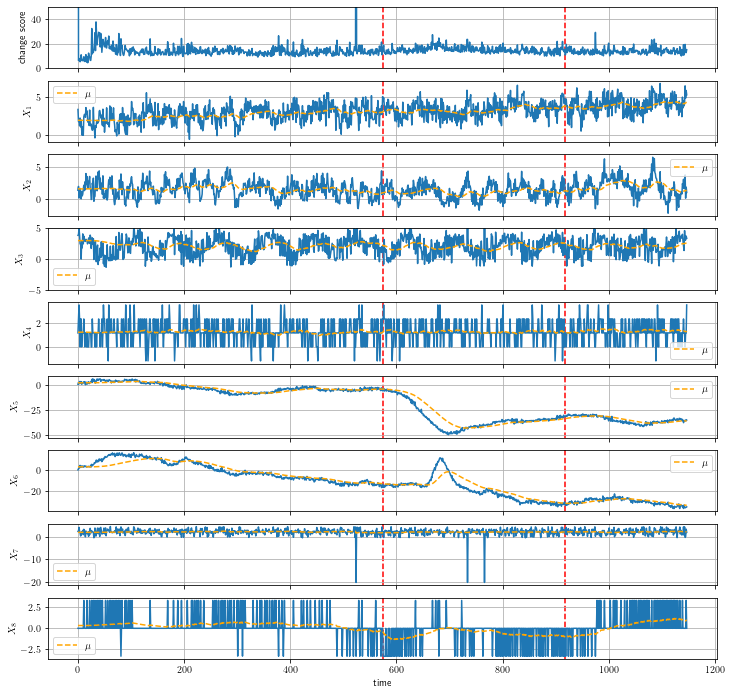

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


2 : 


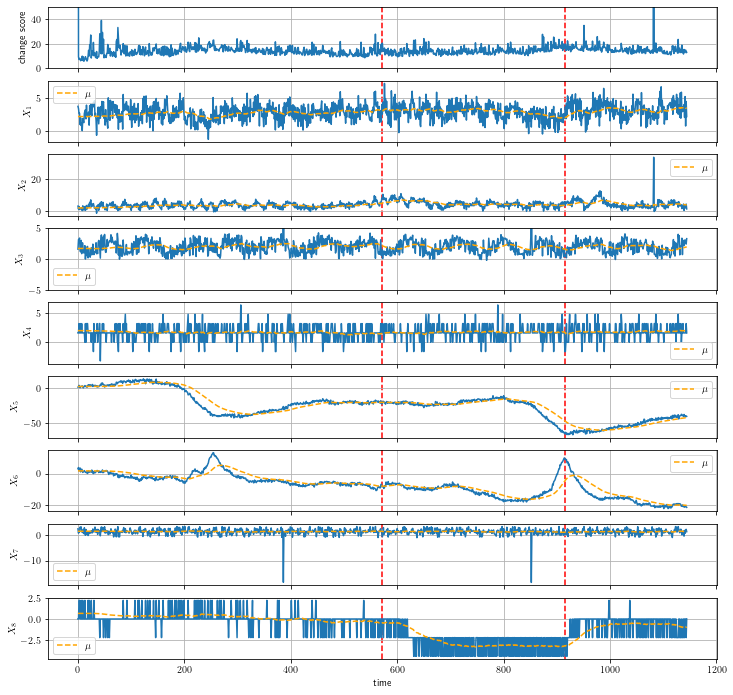

3 : 


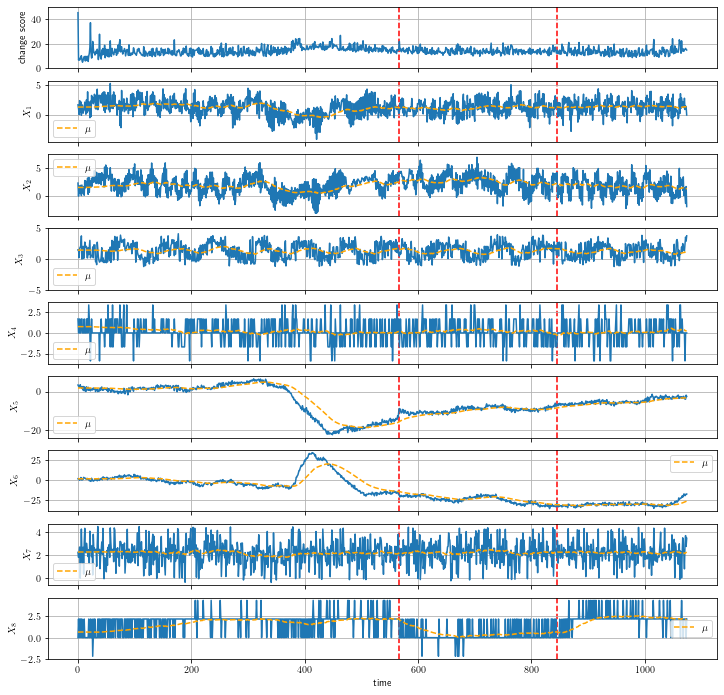

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


4 : 


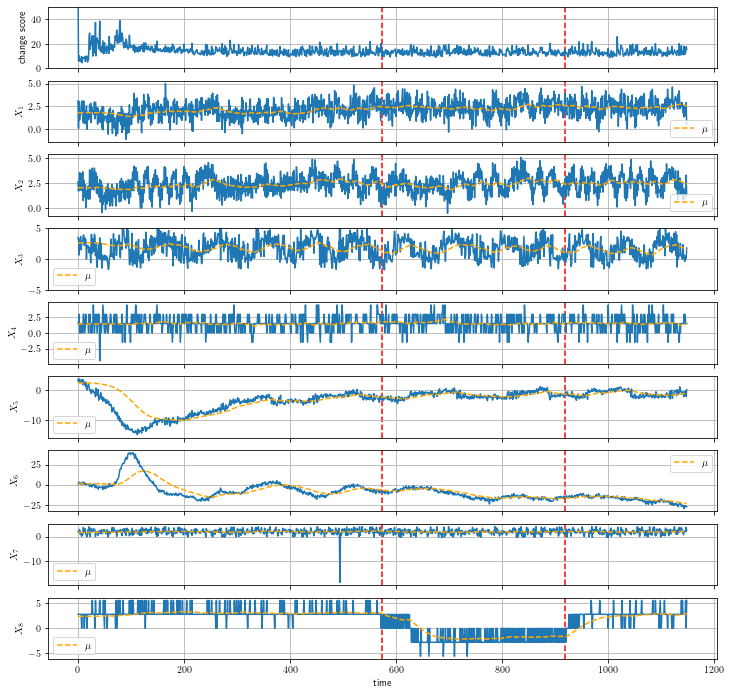

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


5 : 


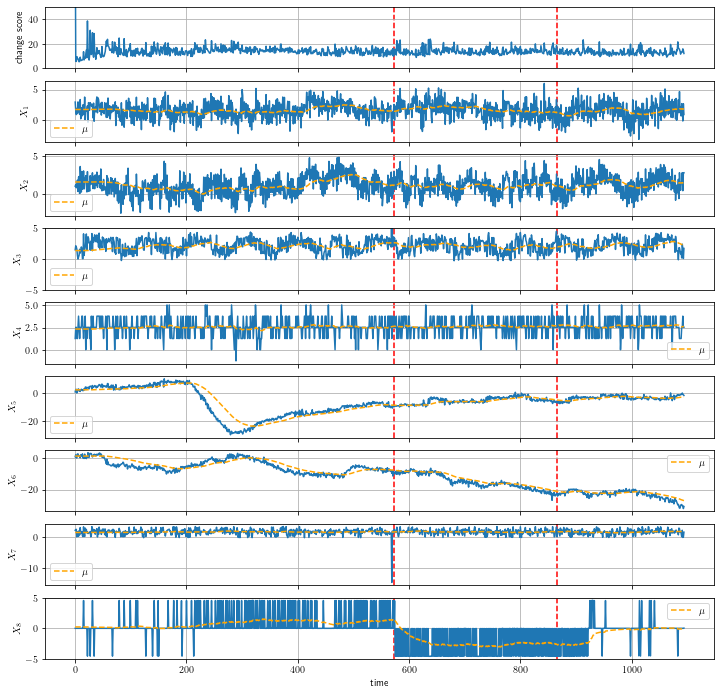

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


6 : 


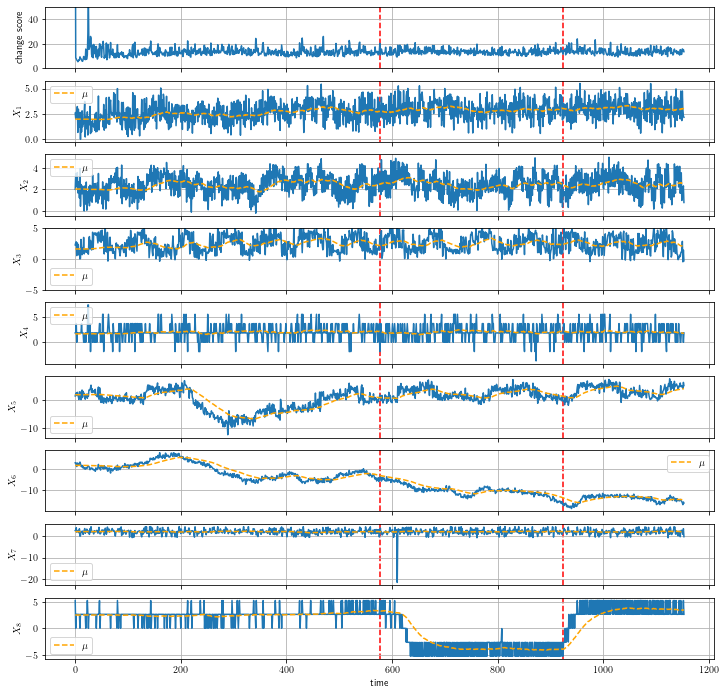

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


7 : 


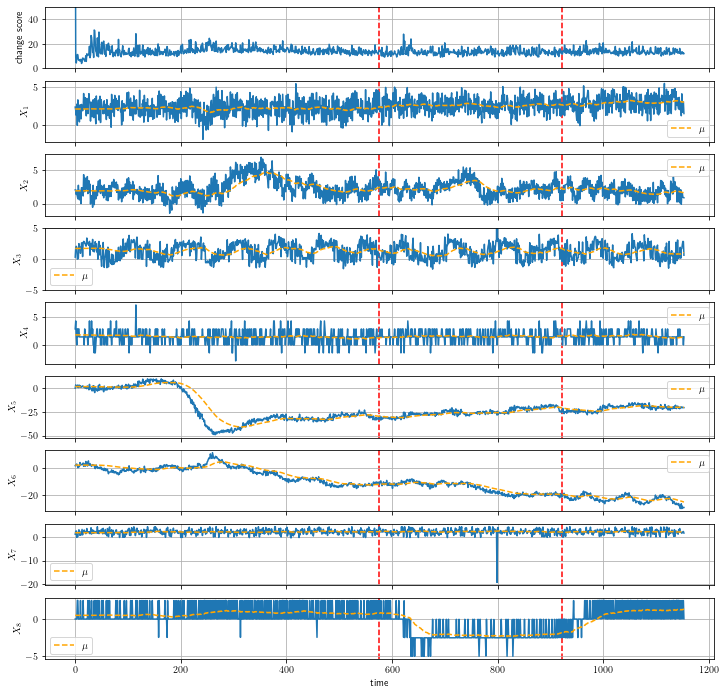

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


8 : 


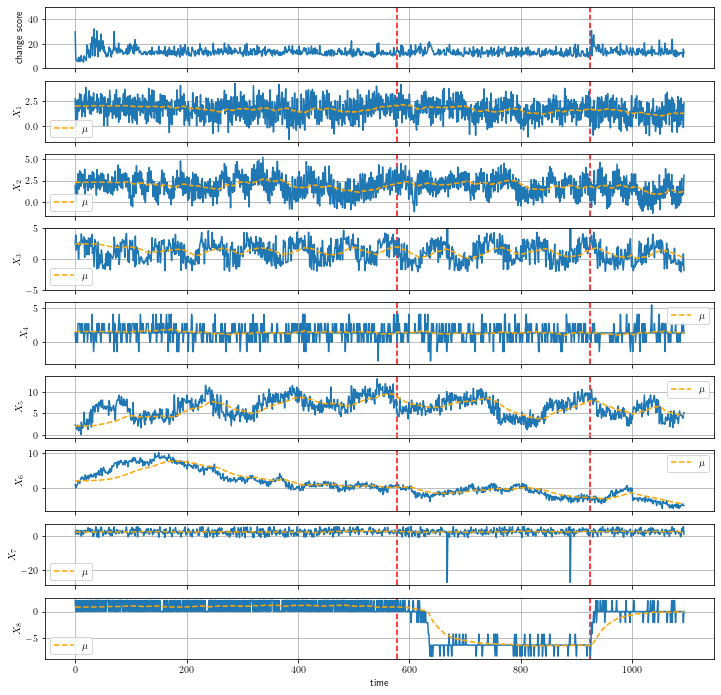

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


9 : 


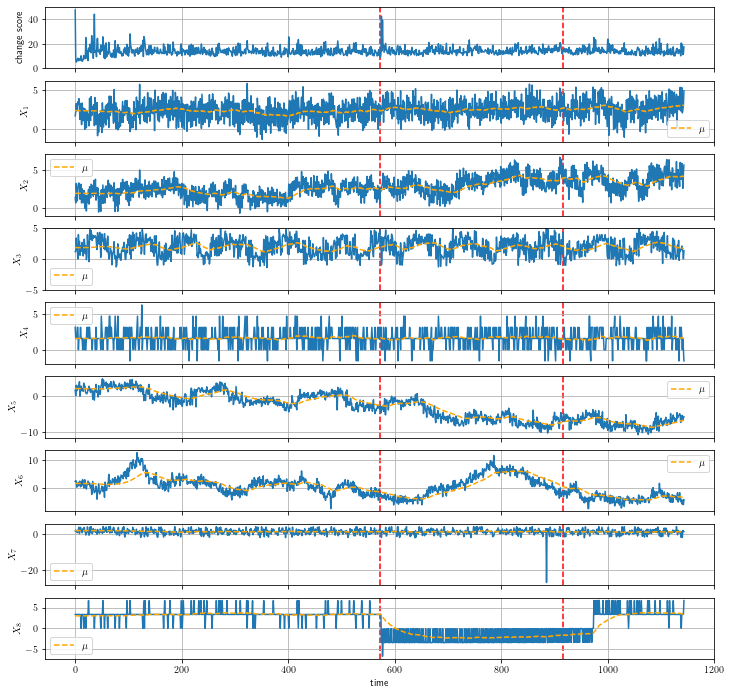

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


10 : 


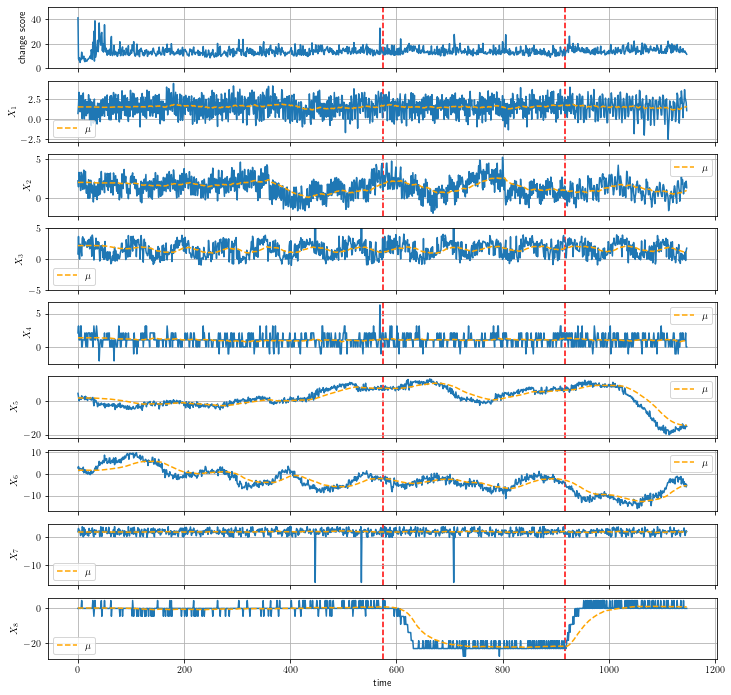

11 : 


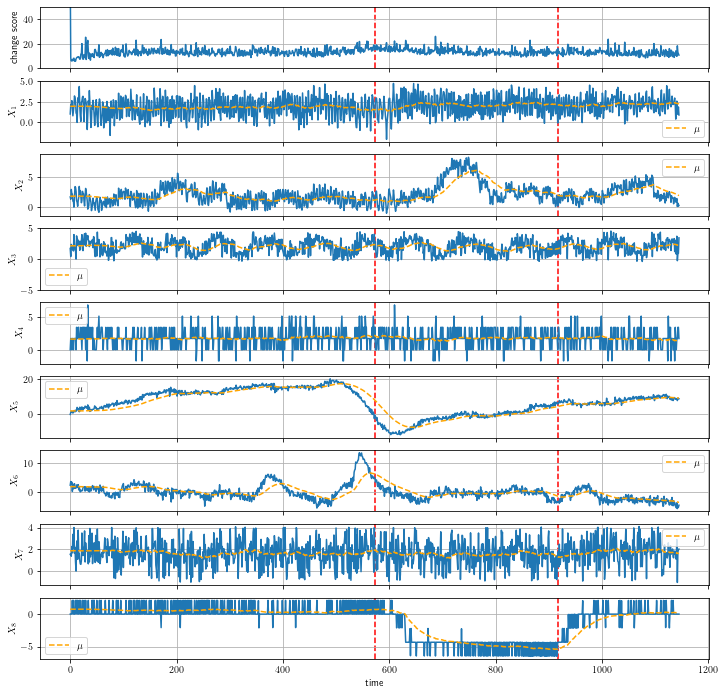

12 : 


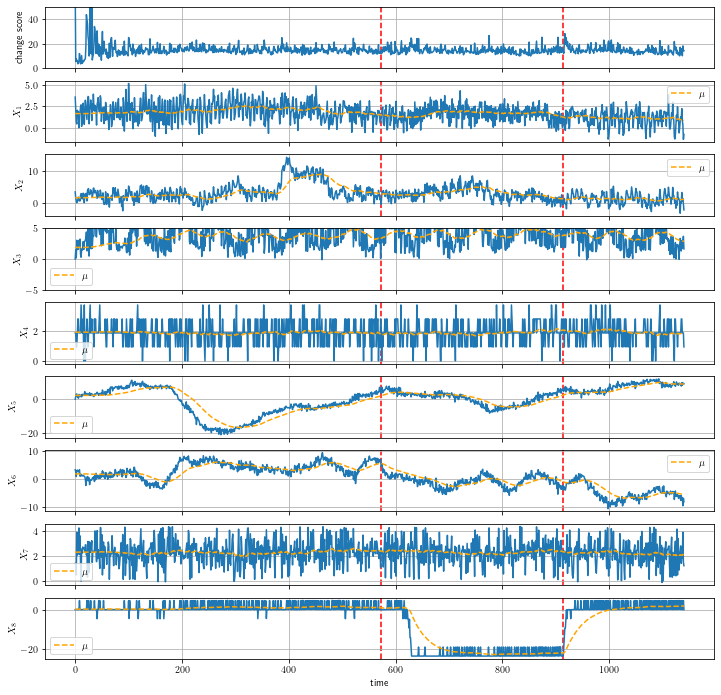

13 : 


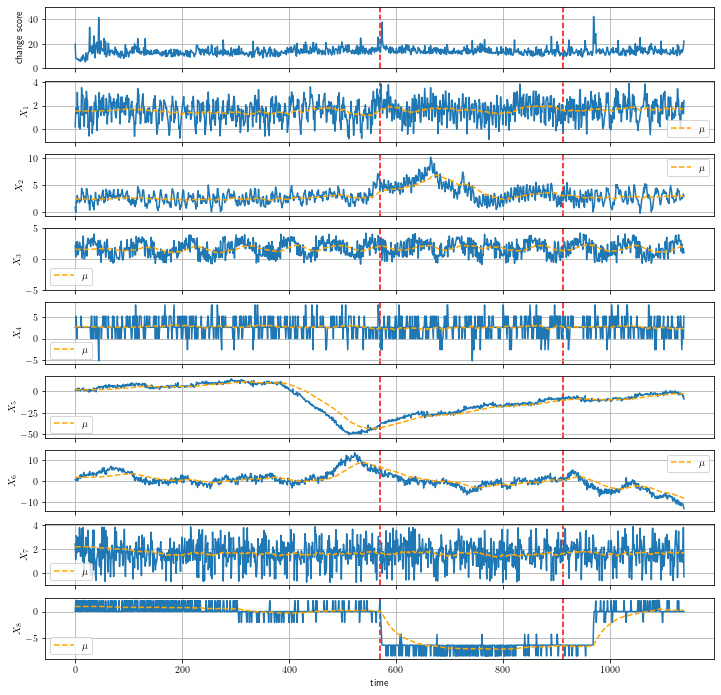

14 : 


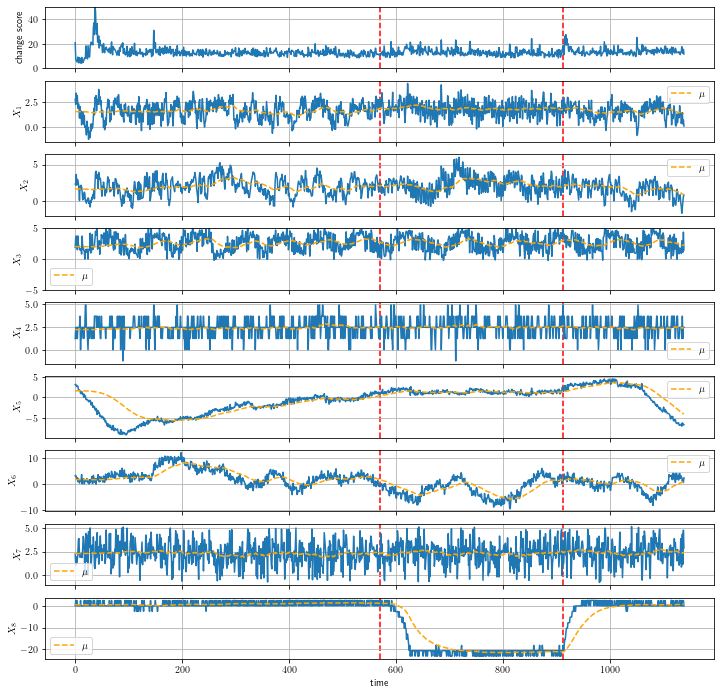

15 : 


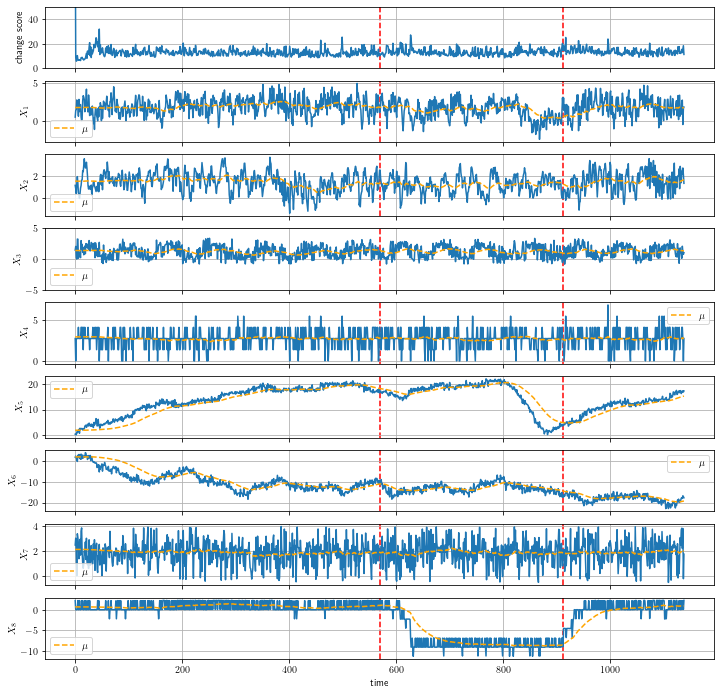

16 : 


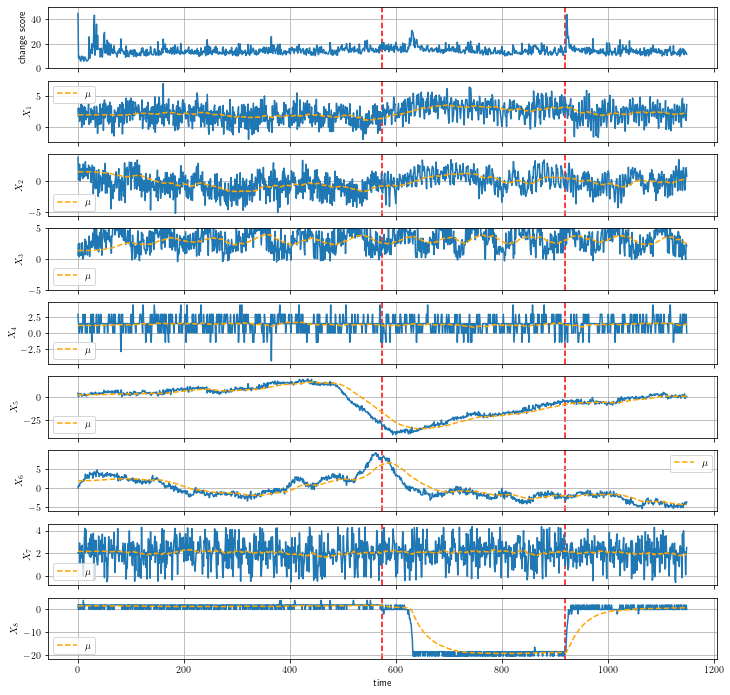

In [28]:
init_start = 0
init_end = 20

k = 1
gamma = 80.0
ratio = 5.0
M = 10000.0

res_sra = []

for n, (X, idxes_anomaly, idxes_change) in enumerate(zip(X_list, idxes_anomaly_list, idxes_change_list)):
    #print(X)
    trial = 0
    count_success = 0
    while count_success < 1:
        seed = trial
        np.random.seed(seed)

        pi0 = np.array([1/k] * k).reshape(-1, 1)
        mu0 = np.hstack([ 
                  np.random.uniform(np.min(X[init_start:init_end, col]), np.max(X[init_start:init_end, col]), k).reshape(-1, 1)
                  for col in range(X.shape[1])
              ])
        sigma0 = np.stack([np.diag((X[init_start:init_end, :].max(axis=0) - X[init_start:init_end, :].min(axis=0))/10) for _ in range(k)])
        theta0 = Theta(pi0, mu0, sigma0)

        rho = ratio * np.exp(-gamma**2/M**2) / (2.0*gamma)
        rho_const = np.repeat(rho, X.shape[0])
        #print('rho = %f' % (rho))
        
        trial += 1

        #try:
        pi_est, mu_est, sigma_est, outliers = sra(X, theta0, rho_const, gamma, t_start=20)
        #pi_est, mu_est, sigma_est = sra(X, theta0, rho_const, gamma, t_start=20)

        scores = []
        for t in range(pi_est.shape[0]):
            if t in outliers:
                #scores.append(np.nan)
                scores.append(scores[-1])
                continue
            
            p = np.zeros(k)
            for i in range(k):
                try:
                    p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], sigma_est[t-1, i, :, :],
                                                               allow_singular=True).pdf(X[t, :])
                except:
                #    print(nearPD(sigma_est[t-1, i, :, :]))
                    p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], nearPD(sigma_est[t-1, i, :, :]),
                                                               allow_singular=True).pdf(X[t, :])
                p[i] = p_i
            p_tot = np.sum(p)
            #print(p_tot)
            if p_tot >= 1.0/np.finfo(float).max:
                scores.append(-np.log(p_tot))
            else:
                scores.append(np.log(np.finfo(float).max))
            #scores.append(-np.log(p_tot + 1e-30))


        scores = np.array(scores)
        
        auc_ = calc_auc_main(scores, idxes_change, 100, X.shape[0], T=50, N_thr=100)
        print(n+1, ':')

        if count_success == 0:
            plot_skab_with_mu(X, idxes_anomaly, idxes_change, mu_est, scores, 
                              min_score=0, max_score=100)

        count_success += 1
        #except:
        #    continue

## Summary

In [31]:
T_auc = 20

In [32]:
X = X_list[5]

In [38]:
# SDEM
r = 0.03
n_cluster = 1
init_start = 20
init_end = 40

np.random.seed(0)

rho_const = np.repeat([r], X.shape[0])
sdem = SDEM(rho_const, alpha=1.0, n_components=n_cluster)

X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
                                       np.max(X[init_start:init_end, j]), 
                                       20).reshape(-1, 1) 
                     for j in range(X.shape[1]) ])

sdem.fit(X_init)

for t in tqdm.tqdm(range(X.shape[0])):
    sdem.update(X[t, :])

pi_est_sdem = np.array(sdem.pi_list)
mu_est_sdem = np.array(sdem.means_list)
sigma_est_sdem = np.array(sdem.covariances_list)

scores_sdem = [np.nan] * score_start

#n_cluster = pi_est.shape[1]
for t in range(score_start, X.shape[0]):
    p = np.zeros(n_cluster)
    for k in range(n_cluster):
        if np.any(np.linalg.eigvals(sigma_est_sdem[t-1, k, :, :]) <= 0.0):
            sigma_est_sdem[t-1, k, :, :] = nearPD(sigma_est_sdem[t-1, k, :, :])
        if X.shape[0] == 1:
            p_k = pi_est[t-1, k] * norm(mu_est_sdem[t-1, k, :], np.sqrt(sigma_est_sdem[t-1, k, :, :])).pdf(X[t, :])
        else:
            try:
                p_k = pi_est[t-1, k] * multivariate_normal(
                    mean=mu_est_sdem[t-1, k, :], 
                    cov=sigma_est_sdem[t-1, k, :, :], 
                    allow_singular=True
                ).pdf(
                    X[t, :].reshape(1, -1)
                )
            except:
                p_k = pi_est[t-1, k] * multivariate_normal(
                    mean=mu_est_sdem[t-1, k, :], 
                    cov=nearPD(sigma_est_sdem[t-1, k, :, :]), 
                    allow_singular=True
                ).pdf(
                    X[t, :].reshape(1, -1)
                )
        p[k] = p_k
    p_tot = np.sum(p)
    if p_tot >= 1.0/np.finfo(float).max:
        scores_sdem.append(-np.log(p_tot))
    else:
        scores_sdem.append(np.log(np.finfo(float).max))

scores_sdem = np.array(scores_sdem)

auc_sdem = calc_auc_main(scores_sdem, idxes_change, 
                         start=100, end=X.shape[0], 
                         T=T_auc, N_thr=100)

100%|██████████| 1154/1154 [00:00<00:00, 3438.45it/s]


In [39]:
# iEM
k = 1
n_cluster = k

init_start = 0
init_end = 20

score_start = 20

#res_iem = []
scores_iem_list = []

np.random.seed(0)
rhos = 1.0 / np.arange(1, X.shape[0]+1)
sdem = SDEM(rhos, alpha=1.0, n_components=n_cluster)

X_init = np.hstack([ np.random.uniform(np.min(X[init_start:init_end, j]), 
                                       np.max(X[init_start:init_end, j]), 
                                       20).reshape(-1, 1) 
                     for j in range(X.shape[1]) ])

sdem.fit(X_init)

for t in tqdm.tqdm(range(X.shape[0])):
    sdem.update(X[t, :])

pi_est_iem = np.array(sdem.pi_list)
mu_est_iem = np.array(sdem.means_list)
sigma_est_iem = np.array(sdem.covariances_list)
        
scores_iem = [np.nan] * score_start

for t in range(score_start, X.shape[0]):
    p = np.zeros(n_cluster)
    for k in range(n_cluster):
        if np.any(np.linalg.eigvals(sigma_est_iem[t-1, k, :, :]) <= 0.0):
            sigma_est_iem[t-1, k, :, :] = nearPD(sigma_est_iem[t-1, k, :, :])
        if X.shape[0] == 1:
            p_k = pi_est[t-1, k] * norm(mu_est_iem[t-1, k, :], np.sqrt(sigma_est_iem[t-1, k, :, :])).pdf(X[t, :])
        else:
            try:
                p_k = pi_est_iem[t-1, k] * multivariate_normal(
                    mean=mu_est_iem[t-1, k, :], 
                    cov=sigma_est_iem[t-1, k, :, :], 
                    allow_singular=True
                ).pdf(
                    X[t, :].reshape(1, -1)
                )
            except:
                p_k = pi_est_iem[t-1, k] * multivariate_normal(
                    mean=mu_est_iem[t-1, k, :], 
                    cov=nearPD(sigma_est_iem[t-1, k, :, :]), 
                    allow_singular=True
                ).pdf(
                    X[t, :].reshape(1, -1)
                )
        p[k] = p_k
    p_tot = np.sum(p)
    if p_tot >= 1.0/np.finfo(float).max:
        scores_iem.append(-np.log(p_tot))
    else:
        scores_iem.append(np.log(np.finfo(float).max))

scores_iem = np.array(scores_iem)

auc_iem = calc_auc_main(scores_iem, idxes_change, 
                        start=100, end=X.shape[0], 
                        T=T_auc, N_thr=100)

100%|██████████| 1154/1154 [00:00<00:00, 3388.51it/s]


In [37]:
# sEM

k = 1
r = 0.03

init_start = 0
score_start = 20

np.random.seed(0)

init_end = X.shape[0]
score_end = X.shape[0]

pi0 = np.array([1/k] * k).reshape(-1, 1)
X_init = np.array([np.hstack([ np.random.uniform(
                                    np.min(X[init_start:init_end, j]), 
                                    np.max(X[init_start:init_end, j]), 
                                    20).reshape(-1, 1) 
                               for j in range(X.shape[1]) ]) for _ in range(k)])

mu0 = np.mean(X_init, axis=1)
sigma0 = np.array([np.cov(X_init[kk, :, :], rowvar=False) for kk in range(k)])
theta0 = Theta(pi0, mu0, sigma0)
        
rho_list = np.repeat([r], X.shape[0])

pi_est_sem, mu_est_sem, sigma_est_sem = sem(X, theta0, rho_list, 
                                            init_start=init_start, init_end=init_end, 
                                            score_start=score_start, score_end=X.shape[0], 
                                            seed=seed)

scores_sem = [np.nan]*score_start
        
D = X.shape[1]

for t in range(score_start, pi_est.shape[0]):
    p = np.zeros(k)
    for i in range(k):
        if D == 1:
            p_i = pi_est[t-1, i] * norm(mu_est[t-1, i, :], np.sqrt(sigma_est[t-1, i, :, :])).pdf(X[t, :])
        else:
            try:
                p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], sigma_est[t-1, i, :, :],
                                                           allow_singular=True).pdf(X[t, :])
            except:
                p_i = pi_est[t-1, i] * multivariate_normal(mu_est[t-1, i, :], nearPD(sigma_est[t-1, i, :, :]),
                                                           allow_singular=True).pdf(X[t, :])
        p[i] = p_i
    p_tot = np.sum(p)
    if p_tot >= 1.0/np.finfo(float).max:
        scores_sem.append(-np.log(p_tot))
    else:
        scores_sem.append(-np.log(np.finfo(float).max))

scores_sem = np.array(scores_sem)

auc_sem = calc_auc_main(scores_sem, idxes_change, 100, X.shape[0], T=50, N_thr=100)

100%|██████████| 1153/1153 [00:00<00:00, 2703.43it/s]


In [40]:
init_start = 0
init_end = 20

k = 1

gamma = 80.0
ratio = 5.0
M = 10000.0

np.random.seed(0)

pi0 = np.array([1/k] * k).reshape(-1, 1)
mu0 = np.hstack([ 
          np.random.uniform(np.min(X[init_start:init_end, col]), np.max(X[init_start:init_end, col]), k).reshape(-1, 1)
          for col in range(X.shape[1])
      ])
sigma0 = np.stack([np.diag((X[init_start:init_end, :].max(axis=0) - X[init_start:init_end, :].min(axis=0))/10) for _ in range(k)])
theta0 = Theta(pi0, mu0, sigma0)

rho = ratio * np.exp(-gamma**2/M**2) / (2.0*gamma)
rho_const = np.repeat(rho, X.shape[0])

pi_est_sra, mu_est_sra, sigma_est_sra, outliers = sra(X, theta0, rho_const, gamma, t_start=20)

scores_sra = []
for t in range(pi_est.shape[0]):
    if t in outliers:
        scores_sra.append(scores_sra[-1])
        continue

    p = np.zeros(k)
    for i in range(k):
        try:
            p_i = pi_est[t-1, i] * multivariate_normal(mu_est_sra[t-1, i, :], sigma_est_sra[t-1, i, :, :],
                                                       allow_singular=True).pdf(X[t, :])
        except:
        #    print(nearPD(sigma_est[t-1, i, :, :]))
            p_i = pi_est[t-1, i] * multivariate_normal(mu_est_sra[t-1, i, :], nearPD(sigma_est_sra[t-1, i, :, :]),
                                                       allow_singular=True).pdf(X[t, :])
        p[i] = p_i
    p_tot = np.sum(p)
    if p_tot >= 1.0/np.finfo(float).max:
        scores_sra.append(-np.log(p_tot))
    else:
        scores_sra.append(np.log(np.finfo(float).max))

scores_sra = np.array(scores_sra)

auc_sra = calc_auc_main(scores_sra, idxes_change, 100, X.shape[0], T=50, N_thr=100)

/Users/shi-fukushima/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


(a) SRA
(b) SDEM
(c) iEM
(d) sEM


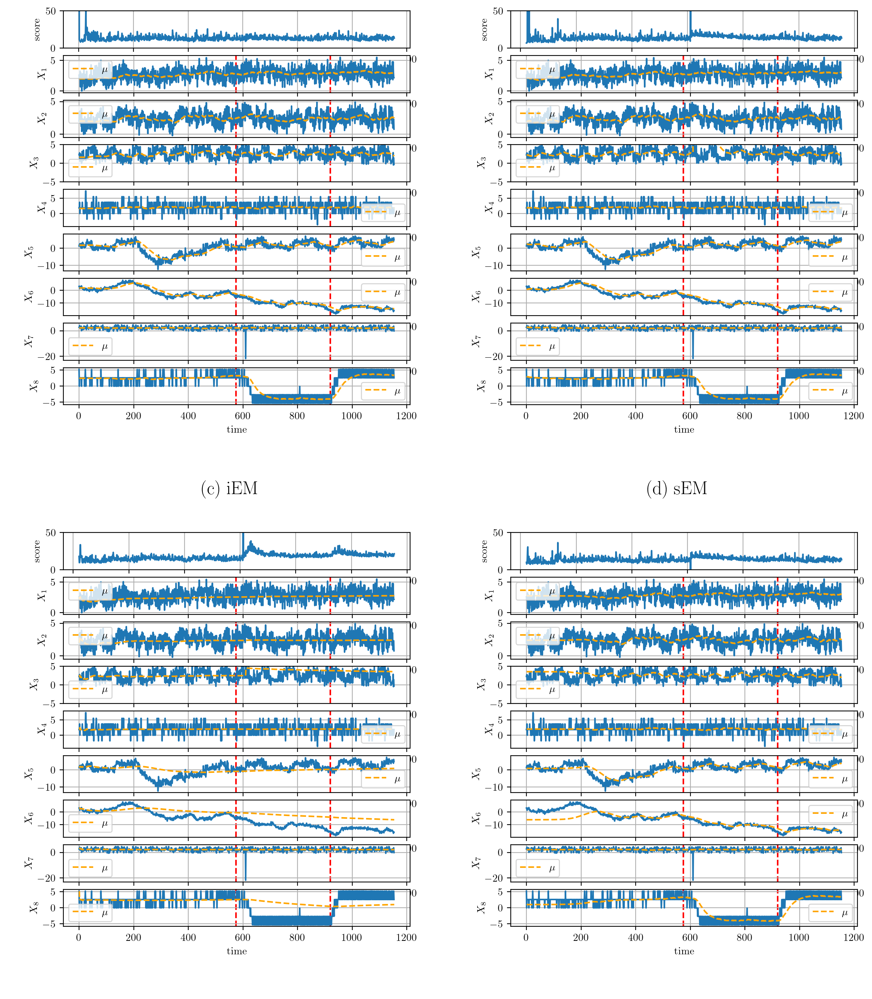

In [51]:
algorithm_list = ['(a) SRA', '(b) SDEM', '(c) iEM', '(d) sEM']
mu_list = [mu_est_sra, mu_est_sdem, mu_est_iem, mu_est_sem]
score_list = [scores_sra, scores_sdem, scores_iem, scores_sem]

#plt.rcParams["figure.autolayout"] = True

plt.rc('font', family='serif')

fig = plt.figure(figsize=(12, 14), dpi=200)

subfigs = fig.subfigures(nrows=2, ncols=2)
for row, (subfig, algo, mu, score) in enumerate(zip(subfigs.flat, algorithm_list, mu_list, score_list)):
    print(algo)
    subfig.suptitle(algo, fontsize=18)

    # create 1x2 subplots per subfig
    axes = subfig.subplots(nrows=9, ncols=1)
    axes[0].plot(np.arange(1, len(X)+1), score, linestyle='-')
    axes[0].set_ylim(0, 50)
    axes[0].set_ylabel('score')
    axes[0].grid()

    for j in range(X.shape[1]):
        axes[j+1].plot(X[:, j])
        for k in range(mu.shape[1]):
            axes[j+1].plot(np.arange(1, len(X)+1), mu[:, k, j], linestyle='--', color='orange', label=r'$\mu$')
        for ic in idxes_change:
            axes[j+1].axvline(x=ic, color='red', linestyle='--', zorder=1)
        axes[j+1].set_ylabel(r'$X_{%d}$' % (j+1))
        if j == 2:
            axes[3].set_ylim(-5, 5)
            
        axes[j+1].legend(loc='best')
        axes[j+1].grid()
    
    axes[-1].set_xlabel('time')
    
#plt.tight_layout()
plt.show()